# Clustering Using ClusterDC
  - **Overview** 
    - Authors: Samer Hmoud, PhD., PGeo., MAuSIMM(CP), Maximilien Meyrieux, MSc., David Kaeter, PhD., GIT.
    - Date: February 16, 2025
    - Tested on Python 3.12
    - Purpose: Introducing ClusterDC: A new density-based clustering algorithm for two-dimensional embedding spaces
    - Origin: Developed for geochemistry, now applicable across multiple domains

  - **Core Components**
    - Data Class:
      - Handles data loading and preprocessing
      - Implements density-based sampling
      - Provides visualization tools
      - Ensures reproducibility with fixed random states
    
    - KDE Class:
      - Multiple kernel functions (Gaussian, Epanechnikov, Laplacian)
      - Adaptive local bandwidth selection
      - Global bandwidth optimization
      - Bayesian optimization for parameter selection
    
    - ClusterDC Class:
      - Density contour analysis
      - Peak detection
      - Hierarchical structure analysis
      - Automatic or user-specified cluster selection

  - **Background and Applications**
    - Originally designed for:
      - Geochemists analyzing multivariate data
      - Multielement assay datasets
      - Identification of geological material types
    
    - Potential applications include:
      - Environmental engineering
      - Natural sciences
      - Data science
      - Pattern recognition
      - Complex, naturally varying datasets

  - **Algorithm Workflow**
    - Stage 1: Data Preparation
      - Load and validate input data
      - Generate data summaries
      - Perform density-based sampling
      - Create visualizations of data distribution
    
    - Stage 2: Dimensionality Reduction
      - Transforms high-dimensional data to 2D using:
        - UMAP (Uniform Manifold Approximation and Projection)
        - PaCMAP (Pairwise Controlled Manifold Approximation)
        - LocalMAP
      - Preserves high-dimensional relationships
    
    - Stage 3: Density-Based Clustering
      - Initial density estimation
      - Cluster identification
      - Label assignment
      - Result visualization

  - **Key Features**
    - Flexibility: Multiple parameter options and data formats
    - Robustness: Handles natural variations and noise
    - Data-Driven: Automatic parameter optimization
    - Interpretability: Comprehensive visualization tools
    - Efficiency: Fast computation for large datasets
    - Reproducibility: Fixed random states throughout analysis

  - **Getting Started**
    - Implementation demonstrated through notebooks covering:
      - Data preparation and preprocessing
      - Density-based sampling
      - KDE parameter selection and optimization
      - Cluster analysis and visualization
      - Result interpretation and validation

*Note: This implementation integrates data handling, density estimation, and clustering methodologies for complex multivariate data analysis.*

# Data Class

## Documentation
• Data Class for Density-Based Sampling and Analysis
  - **Overview**
    - Purpose: Data loading, sampling, cluster analysis, and visualization utility
     - Features: Fixed/customizable random state, multiple analysis methods
     - Core Components: Data management, sampling, clustering, visualization
     - Integration: Works with KDE and ClusterDC classes

  - **Background and Applications**
    - Designed for:
      - Density-based data analysis
      - Sampling strategies from large datasets
      - Statistical visualization
      - Cluster analysis support
    
    - Applications include:
      - Data preprocessing
      - Sample selection
      - Distribution analysis
      - Cluster assignment
      - Density estimation

  - **Class Components**
    - Stage 1: Data Management
      - File operations:
        - CSV and Excel file support
        - Data summary statistics
        - File saving capabilities
      - Data validation and error handling
    
    - Stage 2: Density Analysis
      - Kernel Density Estimation:
        - Scott's rule bandwidth selection
        - Multiple kernel function support
        - Normalized density weights
      
      - Sampling Methods:
        - Random sampling with/without replacement
        - Density-based sampling with KDE weights
        - Customizable random state for reproducibility

    - Stage 3: Visualization Tools
      - Scatter plotting:
        - Label support (string or numeric)
        - Density coloring options
        - Multi-column legend handling
      - Density visualization:
        - Original vs sampled comparisons
        - KDE visualization
        - Sample distribution analysis

  - **Key Features**
    - Reproducibility: Fixed random state across all operations
    - Flexibility: Multiple data format support
    - Visualization: Comprehensive plotting capabilities
    - Integration: Works seamlessly with clustering tools
    - Efficiency: Optimized for large datasets

  - **Getting Started**
  ```python
    # Initialize and load data
    data = Data()
    df = data.read_file('your_data.csv')

    # Random sampling
    random_sample = data.sample(
        n_samples=5000,
        method='random',
        random_state=123
    )

    # Density-based sampling
    density_sample = data.sample(
        n_samples=5000,
        method='density',
        columns=['x', 'y']
    )

    # Plot results
    data.plot_scatter('x', 'y', labels='cluster')
  ```

  *Note: This class is designed for reproducible density-based analysis and visualization, with built-in support for clustering applications.*

# Kernel Density Estimation (KDE)
## Documentation

- **Overview**
  - Implements Kernel Density Estimation with adaptive and global bandwidth selection
  - Designed for efficient density estimation in univariate and multivariate data
  - Specialized optimizations for 2D visualization
  - Supports both automatic and manual parameter selection

- **Key Features**
  - Multiple kernel functions (gaussian, epanechnikov, laplacian)
  - Adaptive local bandwidth based on k-nearest neighbors
  - Global bandwidth with anisotropic covariance estimation
  - Automatic parameter selection using Bayesian optimization
  - Built-in visualization and optimization monitoring
  - Parallel processing for performance optimization

- **Usage Examples**
  - Basic Usage:
    ```python
    # Initialize KDE with default parameters
    kde = KDE(data=your_data)
    # Fit using global bandwidth
    kde.fit(method='global_bandwidth')
    # Get density estimates
    point_densities = kde.get_point_densities()
    # Visualize results
    kde.plot_results()
    ```

  - Advanced Usage:
    ```python
    # Initialize with custom parameters
    kde = KDE(
        data=your_data,
        k_limits=(1, 40),  # Range for k-nearest neighbors
        kernel_types=['gaussian', 'epanechnikov'],
        n_iter=100  # Number of optimization iterations
    )
    # Fit using local bandwidth
    kde.fit(method='local_bandwidth')
    # Monitor optimization progress
    kde.plot_optimization_progress()
    # Get detailed optimization report
    kde.print_optimization_report()
    ```

- **Methods and Parameters**
  - Initialization Parameters:
    - `data`: Input dataset, shape (n_samples, n_features)
    - `k_limits`: Range of neighbors for local bandwidth
    - `kernel_types`: List of kernel functions
    - `n_iter`: Number of optimization iterations
    - `save_path`: Path to save visualizations

  - Core Methods:
    - `fit(method='local_bandwidth')`: Fit the KDE model
      - Supported methods: 'local_bandwidth', 'global_bandwidth', 'scott', 'silverman'
    - `get_point_densities()`: Get density estimates for input points
    - `get_grid_densities()`: Get density estimates on a grid
    - `calculate_grid_with_margin()`: Calculate grid points with margin

  - Visualization Methods:
    - `plot_results()`: Visualize KDE results
    - `plot_optimization_progress()`: Plot optimization progress

  - Reporting Methods:
    - `get_optimization_report()`: Get optimization parameters
    - `print_optimization_report()`: Print formatted report
    - `get_iteration_results()`: Get optimization iterations
    - `save_iteration_results()`: Save results to CSV

- **Algorithm Details**
  - Bandwidth Selection:
    - Global Bandwidth:
      - Uses a single bandwidth matrix for all points
      - Optimizes bandwidth using Bayesian optimization
      - Supports rule-of-thumb methods (Scott's rule, Silverman's rule)
    - Local Bandwidth:
      - Adapts bandwidth based on local data density
      - Uses k-nearest neighbors for local density estimation
      - Optimizes k and scaling factor using Bayesian optimization

  - Kernel Functions:
    - Gaussian: Standard normal kernel
    - Epanechnikov: Optimal kernel in terms of mean squared error
    - Laplacian: Heavy-tailed alternative to Gaussian

  - Optimization Process:
    - Defines search space for parameters
    - Uses Bayesian optimization (GP-minimize)
    - Optimizes likelihood-based objective function
    - Tracks progress and maintains best parameters

- **Implementation Features**
  - Performance:
    - Uses parallel processing for density computation
    - Implements caching for grid calculations
    - Optimized for 2D visualization
  
  - Robustness:
    - Handles edge cases and numerical stability
    - Provides comprehensive error checking
    - Supports both visualization and analysis workflows
  
  - Flexibility:
    - Multiple bandwidth selection methods
    - Various kernel functions
    - Customizable optimization parameters
    - Comprehensive visualization options

# Density-Contour Clustering (ClusterDC)
## Documentation

- **Overview**
  - Density-based clustering algorithm using kernel density estimation (KDE) and contour analysis
  - Identifies clusters in 2D data of varying shapes and sizes
  - Excels at handling noise and detecting natural hierarchies in cluster structure

- **Key Features**
  - Multiple initialization methods (raw data or KDE object)
  - Automatic selection of number of clusters using gap analysis
  - Manual specification of desired number of clusters
  - Hierarchical density-based clustering
  - Comprehensive visualization tools
  - Support for different density estimation methods
  - Robust to noise and non-linear cluster boundaries

- **Usage Examples**
  - Basic Usage:
    ```python
    # Initialize with automatic cluster selection using largest gap
    clusterer = ClusterDC(data=your_data, gap_order=1)  # Use first (largest) gap
    # Run clustering
    assignments, density_info = clusterer.run_clustering()
    # Visualize results
    clusterer.plot_results(assignments, density_info)
    ```

  - Using Pre-fitted KDE:
    ```python
    # First fit KDE
    kde = KDE(data=your_data, kernel_types=['gaussian', 'epanechnikov', 'laplacian'])
    kde.fit(method='global_bandwidth')

    # Initialize ClusterDC with KDE object
    clusterer = ClusterDC(kde_obj=kde, gap_order=1)
    assignments, density_info = clusterer.run_clustering()
    clusterer.plot_results(assignments, density_info)
    ```

  - Specifying Number of Clusters:
    ```python
    # Initialize with specific number of clusters
    clusterer = ClusterDC(
        data=your_data,
        gap_order=None,  # Must be None when specifying n_clusters
        n_clusters=5
    )
    # Run clustering and visualize
    assignments, density_info = clusterer.run_clustering()
    clusterer.plot_results(assignments, density_info)
    # Analyze cluster separability
    clusterer.plot_separability()
    ```

  - Advanced Usage:
    ```python
    # Initialize with custom parameters
    clusterer = ClusterDC(
        data=your_data,
        levels=50,  # Number of density contours
        min_point=1,  # Minimum points per cluster
        gap_order='max_clusters',  # Use all positive separability points
        kde_method='local_bandwidth',  # Use local bandwidth KDE
        kde_kernel_types=['gaussian', 'epanechnikov', 'laplacian'],
        kde_n_iter=100,  # KDE optimization iterations
        kde_k_limits=(1, 40)  # Range for k nearest neighbors
    )
    # Get assignments and analyze
    assignments, density_info = clusterer.run_clustering()
    df = clusterer.get_cluster_assignments()
    ```

- **Algorithm Steps**
  - Density Estimation:
    - Uses KDE to estimate probability density
    - Supports both global and local bandwidth methods
    - Offers multiple kernel functions (gaussian, epanechnikov, laplacian)
    - Creates smooth density estimate of data distribution

  - Contour Analysis:
    - Creates density level sets using contours
    - Constructs hierarchical contour tree
    - Identifies nested structure in density
    - Handles contour cleaning and simplification

  - Peak Detection:
    - Finds local density maxima
    - Analyzes peak significance
    - Determines potential cluster centers
    - Computes density values at peaks

  - Cluster Separation:
    - Analyzes density paths between peaks
    - Computes separability measures
    - Determines significant gaps in density
    - Orders gaps by magnitude

  - Point Assignment:
    - Assigns points to nearest peak
    - Uses density-weighted distances
    - Handles unassigned points
    - Ensures connected clusters

- **Gap Order Methods**
  - Integer Gap Order:
    - Analyzes gaps in separability values
    - Orders gaps by magnitude
    - Selects clusters based on nth largest gap
    - Example: gap_order=1 uses largest gap

  - Maximum Clusters ('max_clusters'):
    - Uses all peaks with positive separability
    - Maximizes number of clusters
    - Requires positive separability values
    - Suitable for exploratory analysis

  - All Possible Clusterings ('all'):
    - Returns multiple clustering solutions
    - Shows hierarchy of clusters
    - Provides complete separability analysis
    - Useful for hierarchical analysis

  - Fixed Number (n_clusters):
    - Uses user-specified number
    - Requires gap_order=None
    - Selects top peaks by density
    - Maintains hierarchical structure

- **Visualization and Output**
  - Visualization Options:
    - Clustering Results (plot_results):
      - Original data plot
      - KDE density contour plot
      - Cluster assignment plot
      - Consistent axis limits across plots
    - Separability Analysis (plot_separability):
      - Separability curve
      - Gap visualization with magnitudes
      - Ordered gap labeling
      - Grid and legend options

  - Output Format:
    - Cluster assignments for each point
    - Density information for visualization
    - Separability analysis data
    - DataFrame with point coordinates and cluster labels
    - Optional multiple clustering solutions

  - Implementation Notes:
    - Requires 2D data input
    - Efficient graph-based algorithms
    - Robust point assignment strategy
    - Comprehensive error handling
    - Progress tracking and reporting
    - Supports both data and KDE initialization

# Import ClusterDC Library

In [1]:
import clusterdc as dc

# Examples

## Dataset 1: Data with Known Labels

The objective of using this simple 2D dataset is to test the algorithm when we have known and easy to detect clusters. This dataset has three distinguish clusters. No need for any dimension reduction as the data is in 2 dimension.

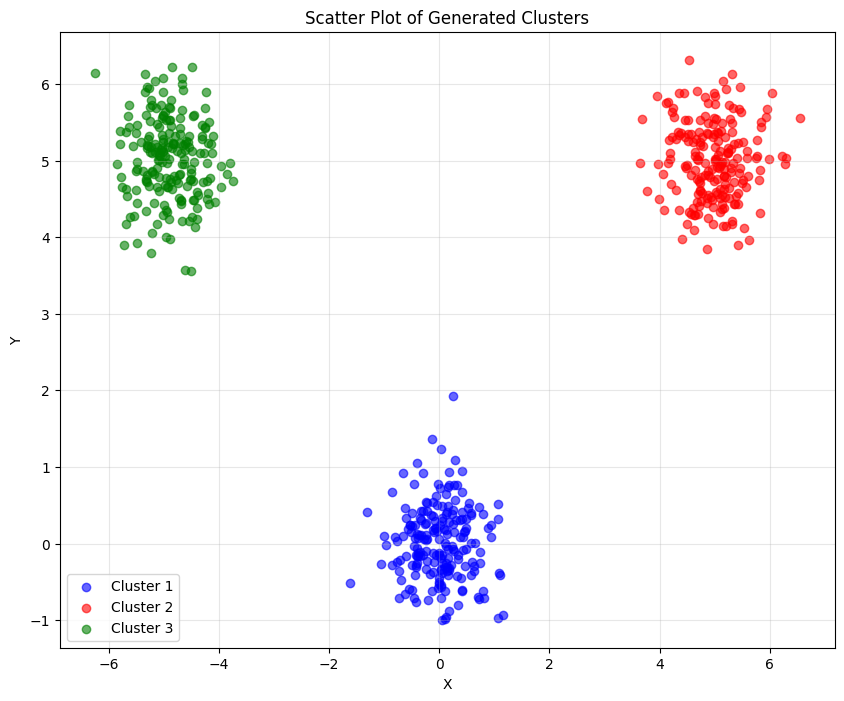

In [2]:
import numpy as np
np.random.seed(42)
X1 = np.random.normal(loc=[0, 0], scale=[0.5, 0.5], size=(200, 2))
X2 = np.random.normal(loc=[5, 5], scale=[0.5, 0.5], size=(200, 2))
X3 = np.random.normal(loc=[-5, 5], scale=[0.5, 0.5], size=(200, 2))
X = np.vstack([X1, X2, X3])

import matplotlib.pyplot as plt

# Create the scatter plot
plt.figure(figsize=(10, 8))

# Plot each cluster with different colors
plt.scatter(X1[:, 0], X1[:, 1], c='blue', label='Cluster 1', alpha=0.6)
plt.scatter(X2[:, 0], X2[:, 1], c='red', label='Cluster 2', alpha=0.6)
plt.scatter(X3[:, 0], X3[:, 1], c='green', label='Cluster 3', alpha=0.6)

# Add labels and title
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Scatter Plot of Generated Clusters')

# Add legend
plt.legend()

# Add grid
plt.grid(True, alpha=0.3)

# Show plot
plt.show()

### ClusterDC with Global Bandwidth Optimization for KDE

In [3]:
# create directory to save KDE outputs
# Create a Data object
data = dc.Data()
# Create a new folder
output_path = data.make_folder("Dataset1/01_Global_Bandwidth")

# Initialize and fit KDE with Global Bandwith Optimization
kde = dc.KDE(
    data=X,
    kernel_types=['gaussian', 'epanechnikov', 'laplacian'],
    n_iter=100,
    save_path=str(output_path/'Dataset1_global_bandwidth_KDE')
)

# Fit KDE with optimized global bandwidth
kde.fit(method='global_bandwidth')

Bayesian Optimization: 100%|█████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 22.38it/s]


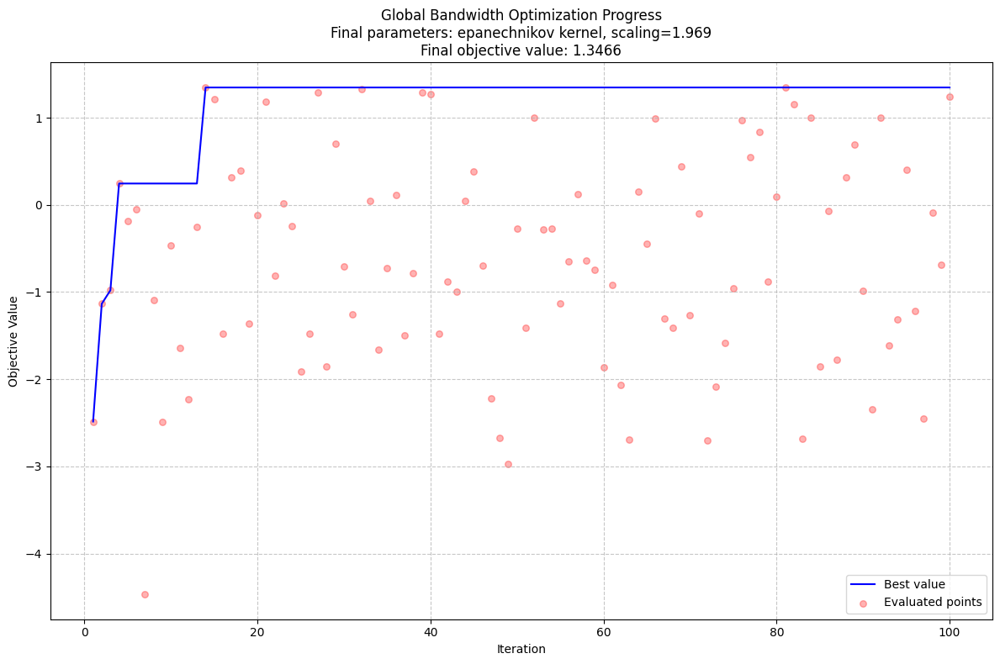

In [4]:
# plot the progress in Bayesian optimization
kde.plot_optimization_progress(save_path=str(output_path/'Dataset1_global_bandwidth_optimization_progress.png'))  

Estimating grid density values: 100%|████████████████████████████████████████| 2500/2500 [00:00<00:00, 25315.27point/s]


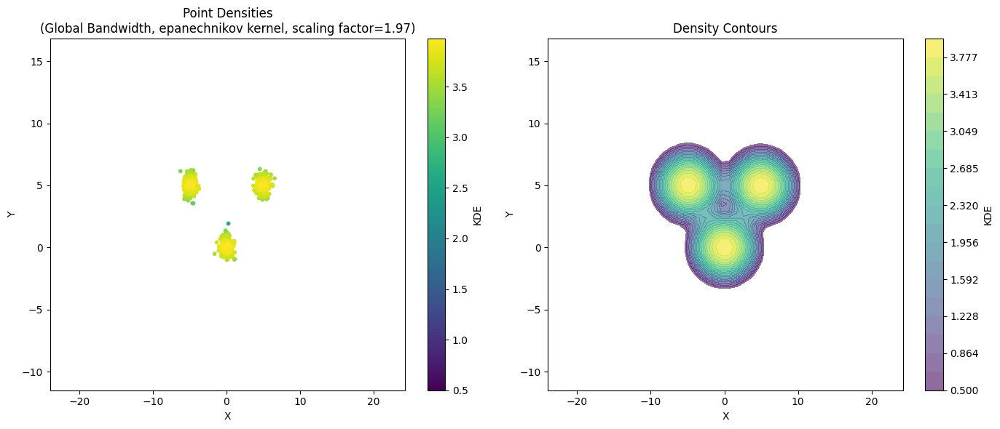

In [5]:
# plot KDE outcomes 
kde.plot_results(vmin=0.5)  

In [6]:
# get the optimal kernel
kde.get_optimization_report()

OptimizationResult(method_used='global_bandwidth', kernel_type='epanechnikov', k=None, scaling_factor=1.968503967700202)

In [7]:
# generate a report with all 100 Bayesian iterations with kernel parameters used and their objective values ranked 
# from best from worst fit
kde.get_iteration_results()

,iteration,kernel,scaling_factor,objective_value
0,81,epanechnikov,1.968504,-1.346579
1,14,epanechnikov,1.968139,-1.346381
2,32,epanechnikov,1.933985,-1.327746
3,27,epanechnikov,1.860652,-1.286520
4,39,epanechnikov,1.859972,-1.286130
...,...,...,...,...
95,83,laplacian,0.386363,2.681583
96,63,epanechnikov,0.100989,2.691942
97,72,laplacian,0.381365,2.698734
98,49,laplacian,0.310693,2.968367


In [8]:
kde.save_model(str(output_path / "kde_model_global_bandwidth.kde"))

KDE model saved successfully to Dataset1\01_Global_Bandwidth\kde_model_global_bandwidth.kde


In [9]:
loaded_kde = kde.load_model(str(output_path / "kde_model_global_bandwidth.kde"))

KDE model loaded successfully from Dataset1\01_Global_Bandwidth\kde_model_global_bandwidth.kde


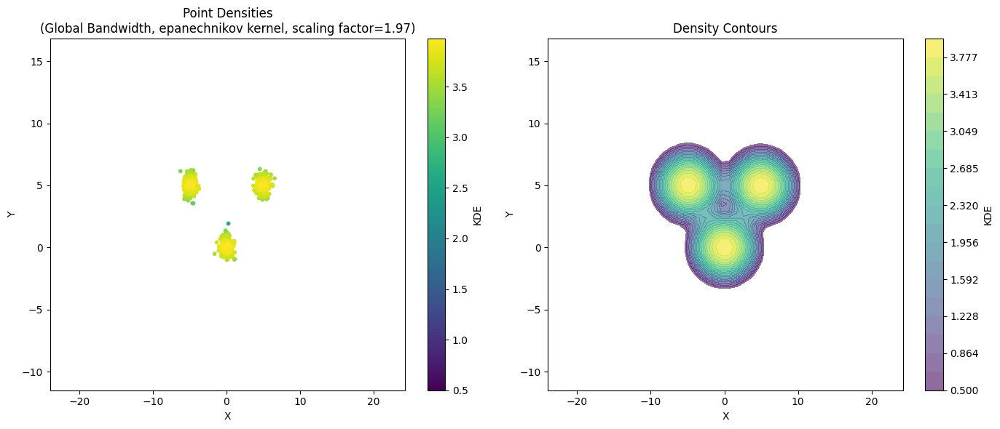

In [10]:
# plot KDE outcomes from the loaded KDE model
loaded_kde.plot_results(vmin=0.5)  

In [11]:
# Initialize and run ClusterDC using gap_order= max_cluster that finds the maximum number of clusters in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order='max_clusters', 
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:02<00:00, 35.28%/s]


Separability and gaps:
   separability       gap gap_order
0      1.000000        --        --
1      0.475359  0.524641         1
2      0.474763  0.000596         3
3      0.000000  0.474763         2

Number of clusters:  3



We have three identidied gaps with three clusters. User might decide to generate max_clusters to get all of them

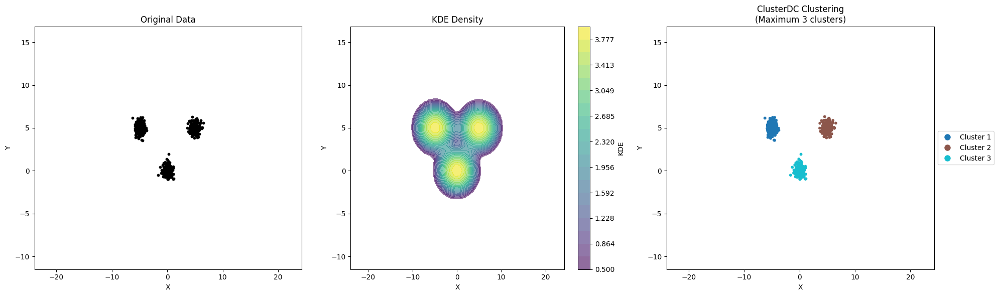

In [12]:
#plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.5)

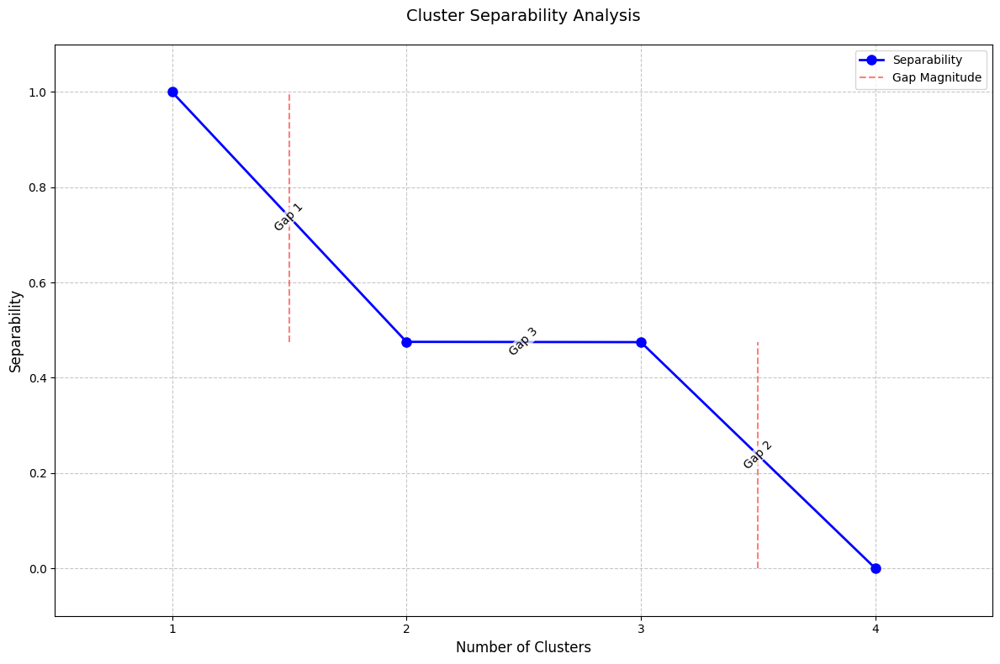

In [13]:
# plot separability plot
cluster_dc.plot_separability(save_path=str(output_path / 'Dataset1_global_bandwidth_separability_analysis.png'))  # save_path is optional

In [14]:
# get a dataframe with clusters assignment
cluster_dc.get_cluster_assignments()

,X,Y,Cluster
0,0.248357,-0.069132,3
1,0.323844,0.761515,3
2,-0.117077,-0.117068,3
3,0.789606,0.383717,3
4,-0.234737,0.271280,3
...,...,...,...
595,-4.947312,4.332987,1
596,-5.300684,5.159891,1
597,-5.796497,5.220237,1
598,-5.009819,5.276245,1


In [16]:
# Initialize and run ClusterDC gap_order=2 which generates clusters based on the second largest gap of separabilities
# in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order=2, 
)

In [17]:
# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:02<00:00, 35.59%/s]


Separability and gaps:
   separability       gap gap_order
0      1.000000        --        --
1      0.475359  0.524641         1
2      0.474763  0.000596         3
3      0.000000  0.474763         2

Number of clusters:  3



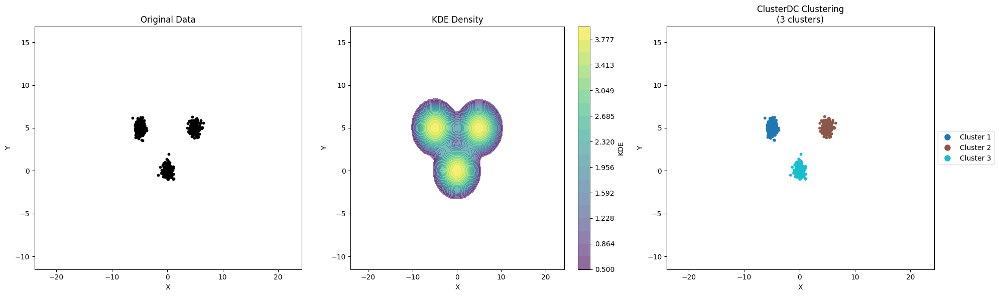

In [18]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.5)

In [19]:
# Initialize and run ClusterDC gap_order='all' which generates all scanrios of clusters based on available gaps and 
# clusters
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order='all', 
)

In [20]:
# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:03<00:00, 29.45%/s]


Separability and gaps:
   separability       gap gap_order
0      1.000000        --        --
1      0.475359  0.524641         1
2      0.474763  0.000596         3
3      0.000000  0.474763         2

Max. number of clusters:  3



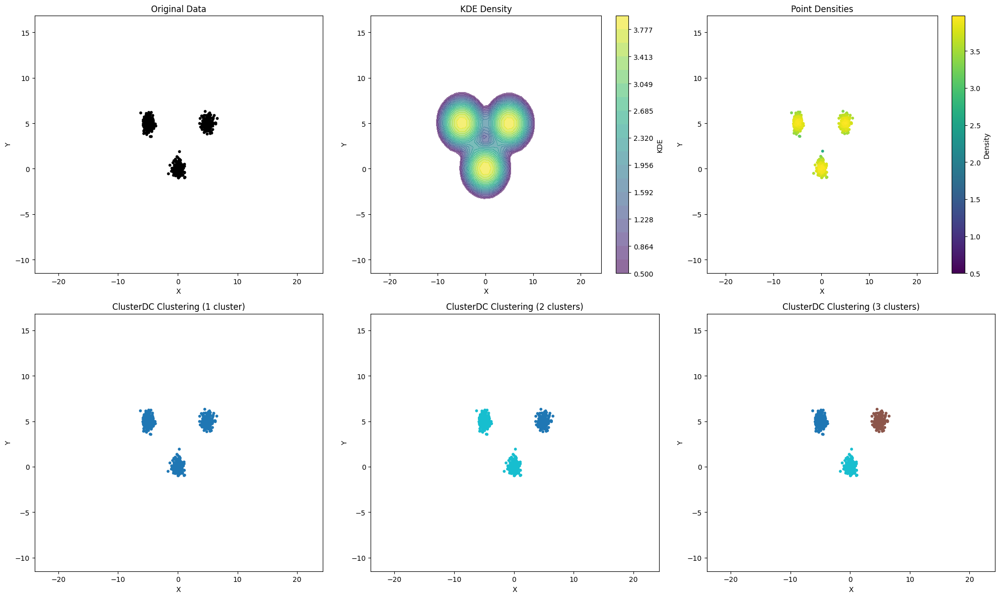

In [21]:
# Plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.5)

In [22]:
# get a dataframe with clusters assignment
cluster_dc.get_cluster_assignments()

,X,Y,1 clusters,2 clusters,3 clusters
0,0.248357,-0.069132,1,2,3
1,0.323844,0.761515,1,2,3
2,-0.117077,-0.117068,1,2,3
3,0.789606,0.383717,1,2,3
4,-0.234737,0.271280,1,2,3
...,...,...,...,...,...
595,-4.947312,4.332987,1,2,1
596,-5.300684,5.159891,1,2,1
597,-5.796497,5.220237,1,2,1
598,-5.009819,5.276245,1,2,1


In [24]:
# Initialize and run ClusterDC and if you know the number of clusters that you want to generate then assigne None to 
# gap_order and n_clusters= the desired number of clusters, here we want to see 3 clusters
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order=None, 
    n_clusters = 3
)

In [25]:
# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:02<00:00, 36.62%/s]


Number of clusters:  3



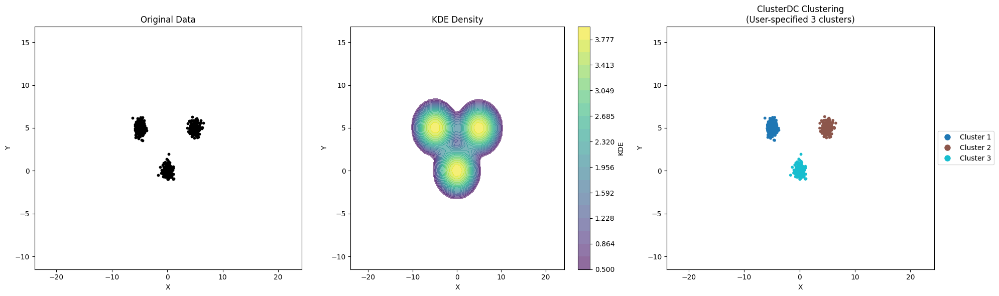

In [26]:
# Plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.5)

It is visually clear that we have 3 clusters in the data. However, if th euser select n_clusters=2 then two clusters will be generated. As shown abobe, Cluster 1 and Cluster 2 got merged together to form now Cluster 1 and Cluster 3 got assigned cluster 2. The merging of clusters is based on the separability values and gap between clusters, so similar clusters get merged first before other clusters.

### ClusterDC with Scott's Rule to Determine Bandwidth of KDE

In [27]:
# Create a new folder
output_path = data.make_folder("Dataset1/02_Scott_Bandwidth")

# Initialize and fit KDE with Scott's rule
kde = dc.KDE(
    data=X,
)

# Fit KDE with global bandwidth's rule
kde.fit(method='scott')

Estimating grid density values: 100%|████████████████████████████████████████| 2500/2500 [00:00<00:00, 19431.60point/s]


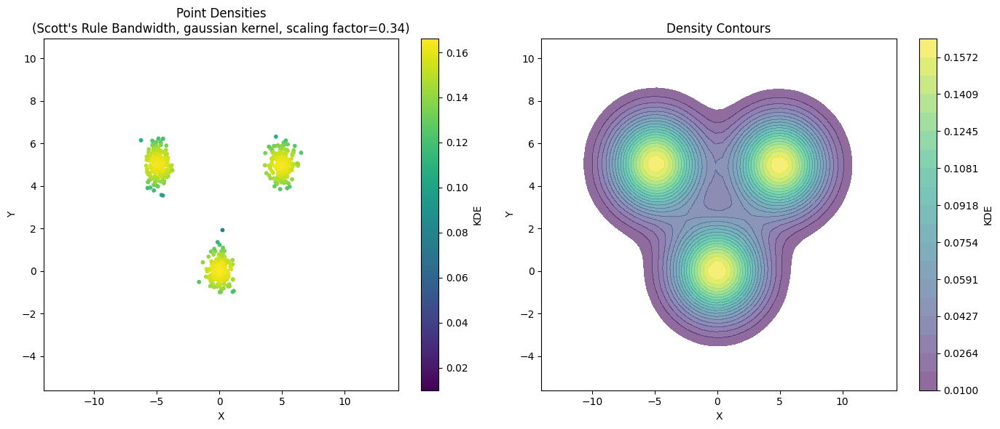

In [28]:
# plot KDE outcomes 
kde.plot_results(vmin=0.01)  

In [29]:
# Initialize and run ClusterDC using max_cluster method that finds the maximum number of clusters in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order='max_clusters',
    save_path=str(output_path / 'Dataset1_Scott_ClusterDC.png')
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:02<00:00, 42.27%/s]


Separability and gaps:
   separability       gap gap_order
0      1.000000        --        --
1      0.708642  0.291358         2
2      0.708107  0.000535         3
3      0.000000  0.708107         1

Number of clusters:  3



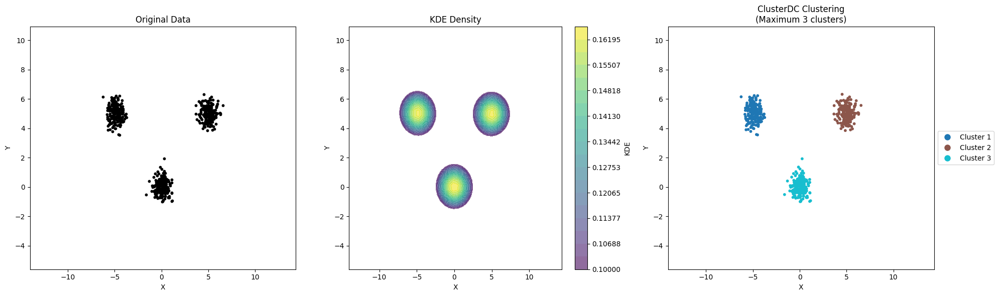

In [30]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.1)

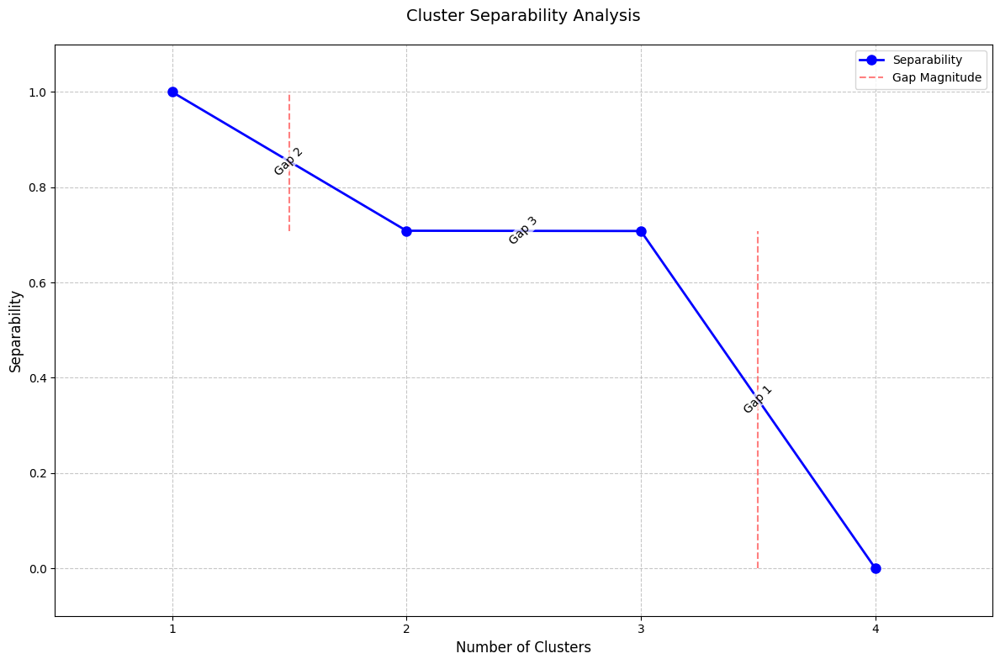

In [31]:
# plot separability plot
cluster_dc.plot_separability(save_path=str(output_path / 'Dataset1_Scott_separability_analysis.png'))

In [32]:
# get a dataframe with clusters assignment
cluster_dc.get_cluster_assignments()

,X,Y,Cluster
0,0.248357,-0.069132,3
1,0.323844,0.761515,3
2,-0.117077,-0.117068,3
3,0.789606,0.383717,3
4,-0.234737,0.271280,3
...,...,...,...
595,-4.947312,4.332987,1
596,-5.300684,5.159891,1
597,-5.796497,5.220237,1
598,-5.009819,5.276245,1


In [33]:
# Initialize and run ClusterDC gap_order=1 which generates clusters based on the largest gap of separabilities
# in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order=1, 
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:02<00:00, 42.81%/s]


Separability and gaps:
   separability       gap gap_order
0      1.000000        --        --
1      0.708642  0.291358         2
2      0.708107  0.000535         3
3      0.000000  0.708107         1

Number of clusters:  3



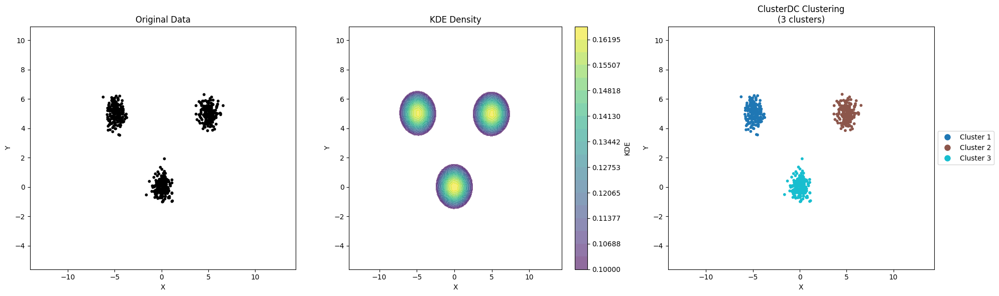

In [34]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.1)

In [35]:
# Initialize and run ClusterDC gap_order='all' which generates all scanrios of clusters based on available gaps and 
# clusters
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order='all', 
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:02<00:00, 38.70%/s]


Separability and gaps:
   separability       gap gap_order
0      1.000000        --        --
1      0.708642  0.291358         2
2      0.708107  0.000535         3
3      0.000000  0.708107         1

Max. number of clusters:  3



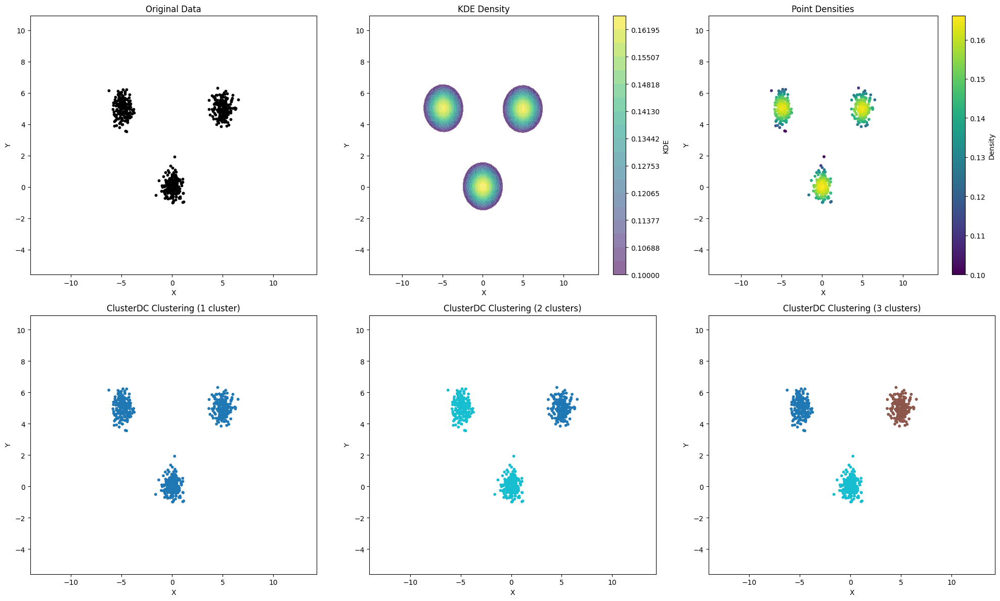

In [36]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.1)

In [37]:
# get a dataframe with clusters assignment
cluster_dc.get_cluster_assignments()

,X,Y,1 clusters,2 clusters,3 clusters
0,0.248357,-0.069132,1,2,3
1,0.323844,0.761515,1,2,3
2,-0.117077,-0.117068,1,2,3
3,0.789606,0.383717,1,2,3
4,-0.234737,0.271280,1,2,3
...,...,...,...,...,...
595,-4.947312,4.332987,1,2,1
596,-5.300684,5.159891,1,2,1
597,-5.796497,5.220237,1,2,1
598,-5.009819,5.276245,1,2,1


### ClusterDC with Local Bandwidth Optimization for KDE

In [38]:
# Create a new folder
output_path = data.make_folder("Dataset1/03_Local_Bandwidth")

# Initialize and fit KDE with local optimized bandwidth
kde = dc.KDE(
    data=X,
    kernel_types=['gaussian', 'epanechnikov', 'laplacian'],
    n_iter=50
)

# Fit KDE with optimized local bandwidth
kde.fit(method='local_bandwidth')

Bayesian Optimization: 100%|███████████████████████████████████████████████████████████| 50/50 [00:07<00:00,  7.13it/s]


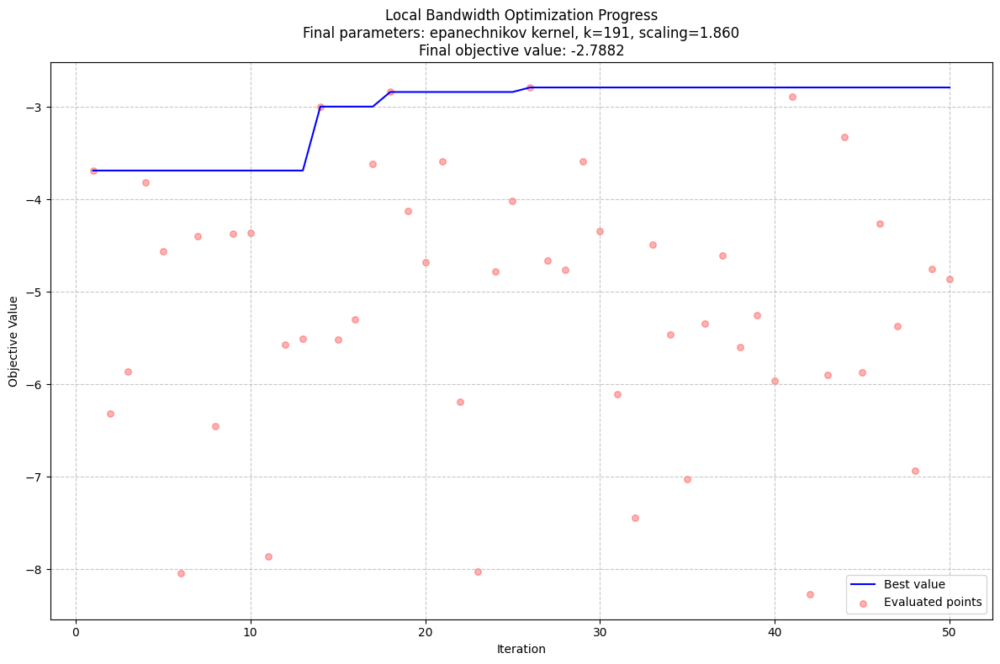

In [39]:
# plot the progress in Bayesian optimization
kde.plot_optimization_progress(save_path=str(output_path / 'Dataset1_local_bandwidth_optimization_progress.png'))  # Optional save_path

Estimating grid density values: 100%|█████████████████████████████████████████| 2500/2500 [00:01<00:00, 2170.21point/s]


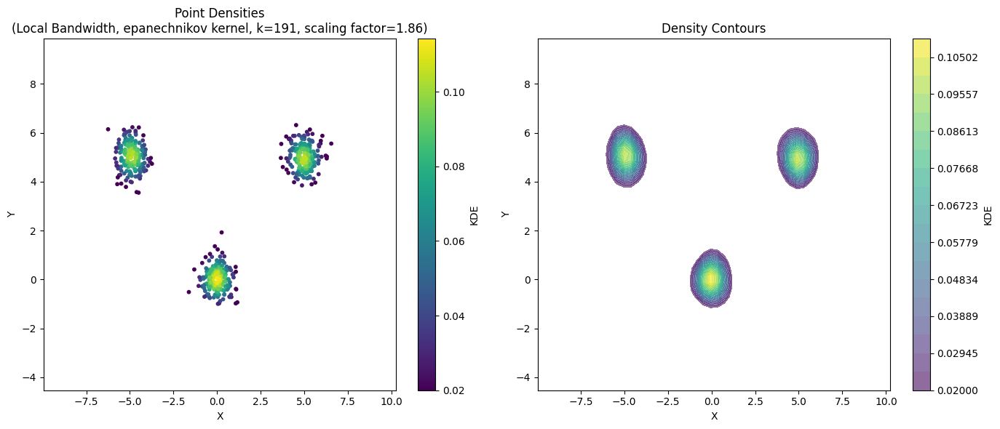

In [40]:
# plot KDE outcomes 
kde.plot_results(vmin=0.02) 

In [41]:
# get the optimal kernel
kde.get_optimization_report()

OptimizationResult(method_used='local_bandwidth', kernel_type='epanechnikov', k=191, scaling_factor=1.8599716691753634)

In [42]:
# generate a report with all 50 Bayesian iterations with kernel parameters used and their objective values ranked 
# from best from worst fit
kde.get_iteration_results()

,iteration,k,kernel,scaling_factor,objective_value
0,26,191,epanechnikov,1.859972,2.788164
1,18,111,epanechnikov,1.860652,2.837098
2,41,35,epanechnikov,1.822974,2.890196
3,14,166,epanechnikov,1.683070,2.995004
4,44,131,epanechnikov,1.415628,3.325488
5,29,163,epanechnikov,1.223466,3.584983
6,21,181,epanechnikov,1.214827,3.586272
7,17,139,gaussian,1.700341,3.614128
8,1,192,gaussian,1.581413,3.686601
9,4,158,gaussian,1.471798,3.812907


In [43]:
# Initialize and run ClusterDC using max_cluster method that finds the maximum number of clusters in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order='max_clusters', 
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:02<00:00, 37.69%/s]


Separability and gaps:
   separability  gap gap_order
0           1.0   --        --
1           1.0 -0.0         2
2           1.0 -0.0         3
3           0.0  1.0         1

Number of clusters:  3



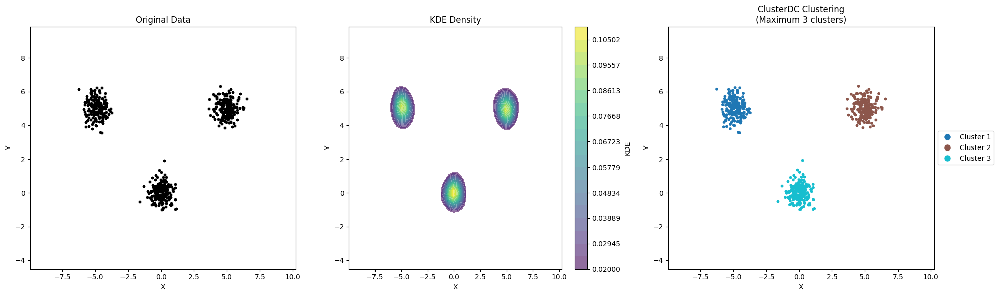

In [44]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.02)

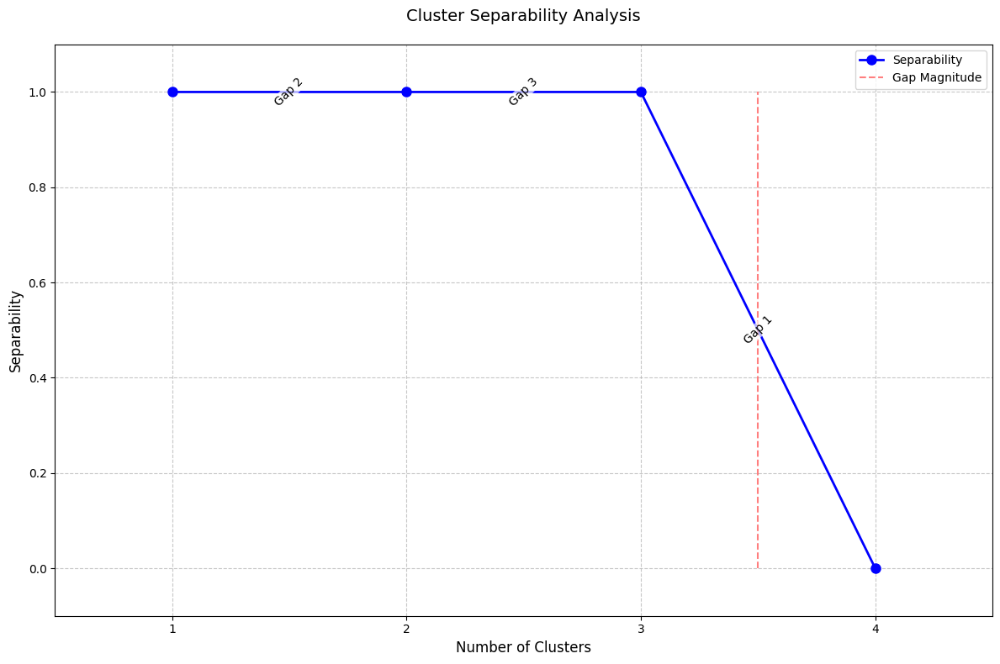

In [45]:
# plot separability plot
cluster_dc.plot_separability(save_path=str(output_path / 'Dataset1_local_bandwidth_analysis.png'))  # save_path is optional

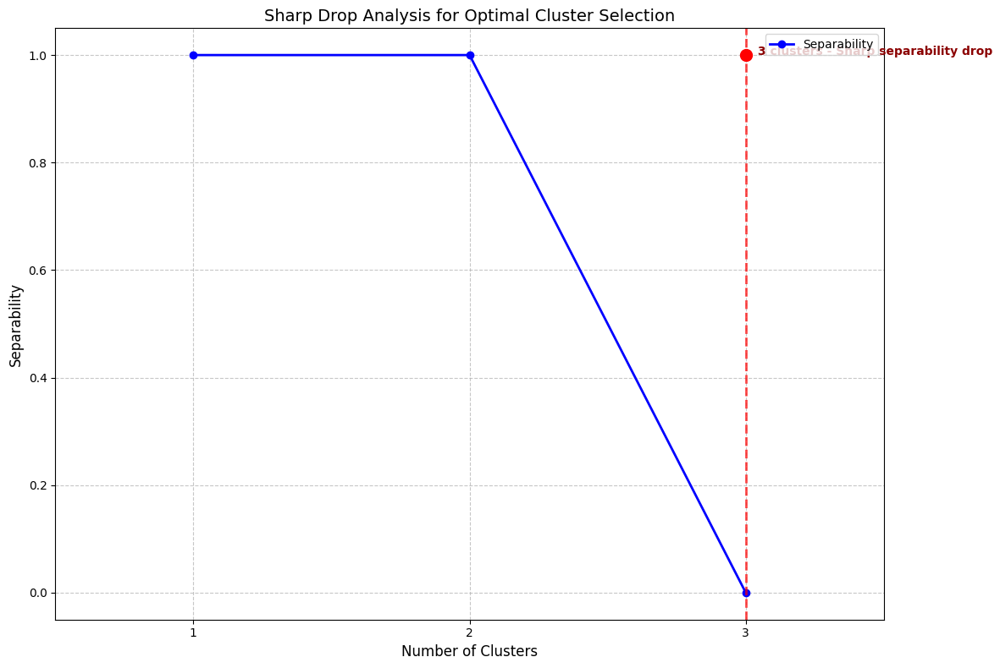

Optimal cluster count identified: 3 (based on sharp separability drop)


In [46]:
# Find optimal number of clusters with the new method name
optimal_k = cluster_dc.find_optimal_clusters()

In [47]:
# get a dataframe with clusters assignment
cluster_dc.get_cluster_assignments()

,X,Y,Cluster
0,0.248357,-0.069132,3
1,0.323844,0.761515,3
2,-0.117077,-0.117068,3
3,0.789606,0.383717,3
4,-0.234737,0.271280,3
...,...,...,...
595,-4.947312,4.332987,1
596,-5.300684,5.159891,1
597,-5.796497,5.220237,1
598,-5.009819,5.276245,1


In [48]:
# Initialize and run ClusterDC using gap_order=all method that finds the scanrios of clusters in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order='all', 
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:02<00:00, 34.02%/s]


Separability and gaps:
   separability  gap gap_order
0           1.0   --        --
1           1.0 -0.0         2
2           1.0 -0.0         3
3           0.0  1.0         1

Max. number of clusters:  3



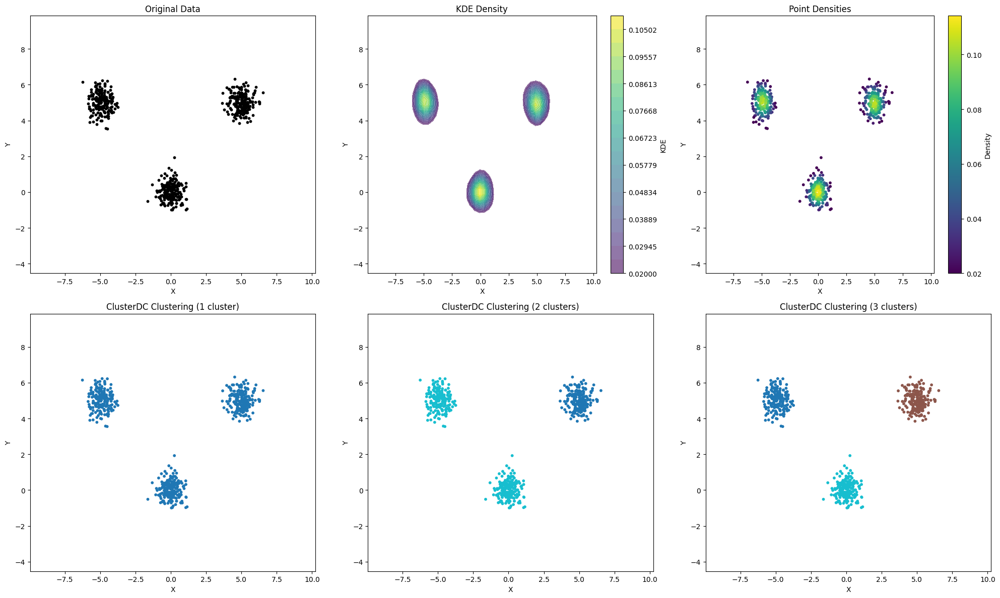

In [49]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.02)

In [50]:
# Initialize and run ClusterDC using gap_order=1 method that finds the clusters of the largest gap in separability 
# in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order=1,
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:02<00:00, 37.12%/s]


Separability and gaps:
   separability  gap gap_order
0           1.0   --        --
1           1.0 -0.0         2
2           1.0 -0.0         3
3           0.0  1.0         1

Number of clusters:  3



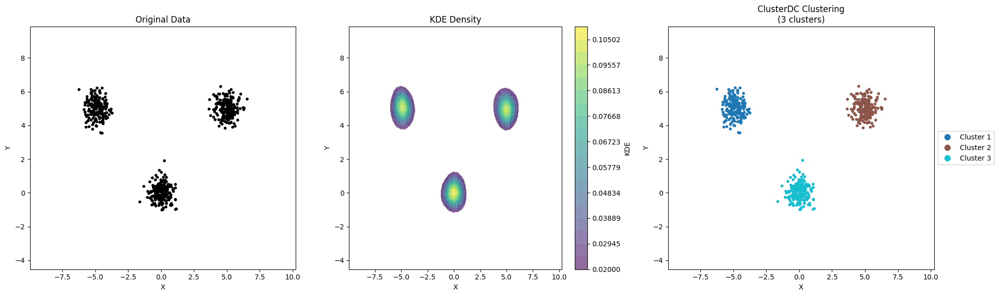

In [51]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.02)

In [52]:
# Initialize and run ClusterDC using n_cluster=3 to find 3 clusters in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order=None, 
    n_clusters=3
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:02<00:00, 37.97%/s]


Number of clusters:  3



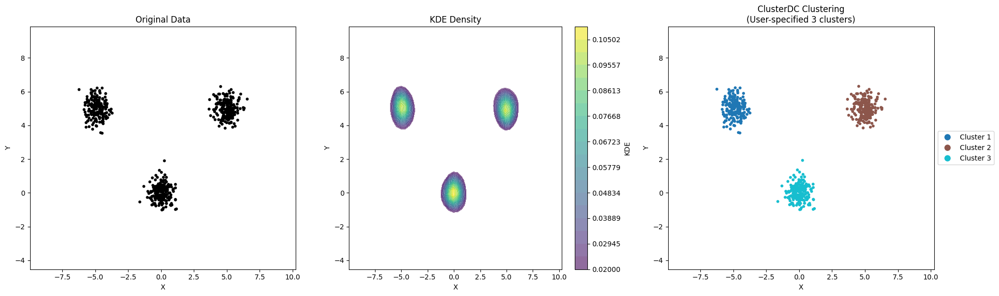

In [53]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.02)

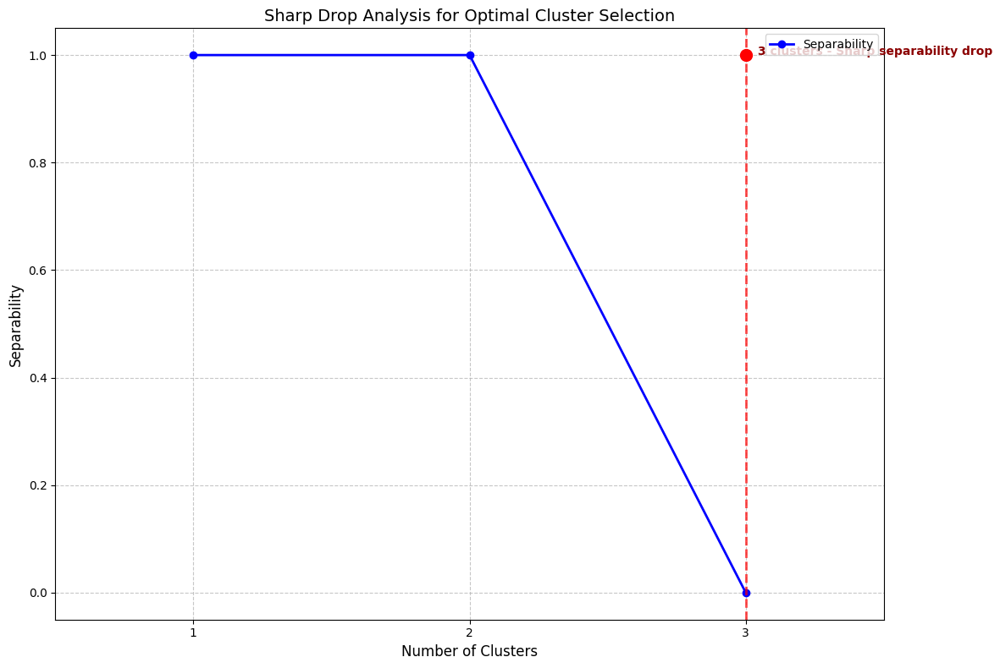

Optimal cluster count identified: 3 (based on sharp separability drop)


In [54]:
# Find optimal number of clusters with the new method name
optimal_k = cluster_dc.find_optimal_clusters()

## Dataset 2: Real Data Without Known labels

This dataset is used in the ClusterDC paper. It was generated after applying PaCMAP to a multivariate dataset. We will try to identify the main clusters using this method. The results are different from the basic implementation of KDE and ClusterDC in the paper and provide more insights into the best way of using ClusterDC.

In [3]:
# create directory to save KDE outputs
# Create a Data object
data = dc.Data()
# Create a new folder
output_path = data.make_folder("Dataset2")
# read csv file with data
df = data.read_file(URL='https://github.com/samerhmoud/clusterdc/blob/main/clusterdc/datasets/training_data.csv.csv')
df

TypeError: Data.read_file() missing 1 required positional argument: 'file_path'

In [3]:
data.get_summary()

,dtype,count,missing,missing_%,unique,mean,std,min,25%,50%,75%,max
PaCMAP_X,float64,18704,0,0.0,18704,-0.086,5.652,-12.789,-3.840,-0.195,4.030,11.286
PaCMAP_Y,float64,18704,0,0.0,18702,0.026,5.405,-9.591,-4.553,-0.497,4.399,11.207


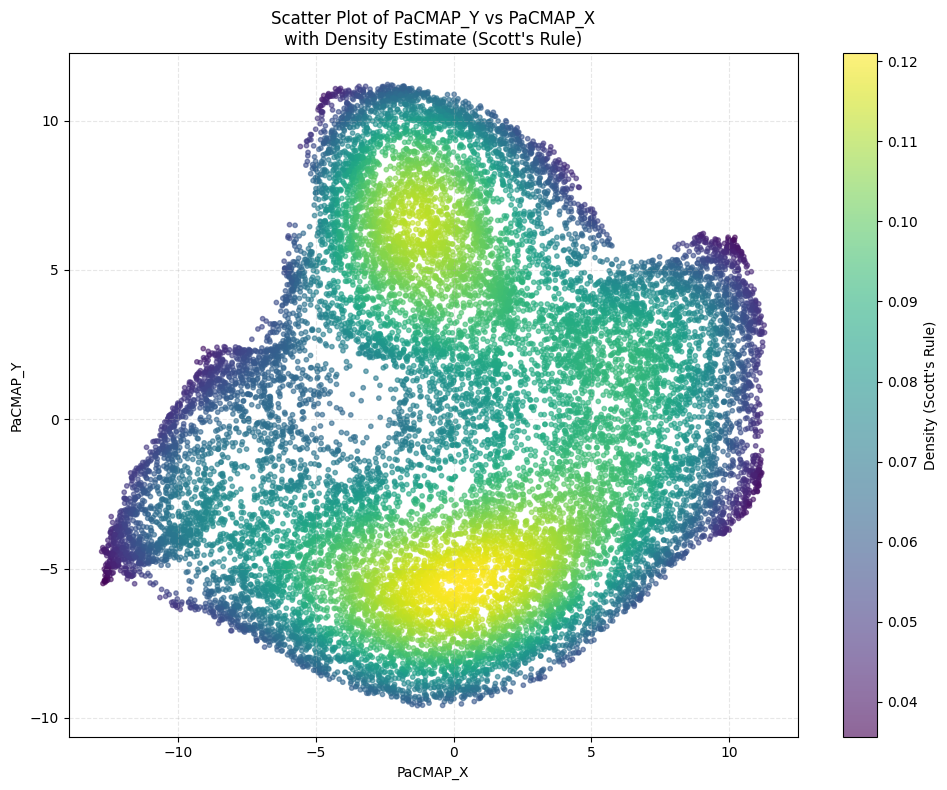

In [4]:
data.plot_scatter(x='PaCMAP_X', y='PaCMAP_Y', save_path=str(output_path / 'dataset2.png'), show_kde=True)

We have 18,704 samples, and it would take a long time to do the full analysis with this number. The solution is to sample a reasonable number of points from the data while preserving both high and low density areas. In this example, 5,000 points will be sampled from the whole dataset, ensuring that areas with higher density have a greater chance of being sampled than low density areas.

,PaCMAP_X,PaCMAP_Y,kde_density
0,0.709443,-5.948870,0.119779
1,9.364301,-0.238479,0.070875
2,-2.183837,-8.038670,0.090499
3,-1.868341,1.786352,0.077415
4,-2.404999,9.341936,0.090257
...,...,...,...
4995,-3.315307,-7.763679,0.088333
4996,1.592524,6.652590,0.093537
4997,4.102388,-1.435929,0.094140
4998,-3.565149,4.955522,0.092868


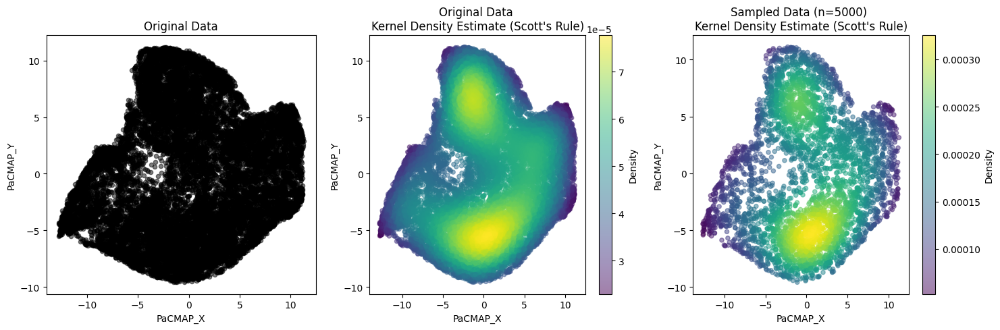

In [5]:
# compare visually original data KDE agains sampled data KDE
df_density_samples = data.plot_density_samples(x='PaCMAP_X', y='PaCMAP_Y',n_samples=5000, return_samples=True)
df_density_samples

In [6]:
# create a new dataframe df_sample that selected randomly 5000 samples while ensuring low and high density areas are represented
# fairly in the new dataframe to expedite the analysis computational time.
df_sample = data.sample(n_samples=5000, method='density')
df_sample

,PaCMAP_X,PaCMAP_Y,kde_density
0,0.709443,-5.948870,0.119779
1,9.364301,-0.238479,0.070875
2,-2.183837,-8.038670,0.090499
3,-1.868341,1.786352,0.077415
4,-2.404999,9.341936,0.090257
...,...,...,...
4995,-3.315307,-7.763679,0.088333
4996,1.592524,6.652590,0.093537
4997,4.102388,-1.435929,0.094140
4998,-3.565149,4.955522,0.092868


In case we had large dataset and we want to estimate time required to generate KDE on our machine, we can use this function

Using DataFrame from Data object
Data shape: (18704, 3)
Using 5 evenly distributed sample sizes: [100, 4800, 9000, 10000, 18600]
Note: Target size 100,000 exceeds available data (18,704).
Extrapolating 5.3x beyond dataset size.

Running KDE benchmark with 'scott' method...

Benchmarking with 100 samples:
  Run 1/3: 0.01 seconds
  Run 2/3: 0.01 seconds
  Run 3/3: 0.01 seconds
  Average time for 100 samples: 0.01 seconds (±0.00)

Benchmarking with 4,800 samples:
  Run 1/3: 0.87 seconds
  Run 2/3: 0.86 seconds
  Run 3/3: 0.85 seconds
  Average time for 4,800 samples: 0.86 seconds (±0.01)

Benchmarking with 9,000 samples:
  Run 1/3: 3.16 seconds
  Run 2/3: 2.79 seconds
  Run 3/3: 2.90 seconds
  Average time for 9,000 samples: 2.95 seconds (±0.16)

Benchmarking with 10,000 samples:
  Run 1/3: 3.46 seconds
  Run 2/3: 3.57 seconds
  Run 3/3: 3.57 seconds
  Average time for 10,000 samples: 3.53 seconds (±0.05)

Benchmarking with 18,600 samples:
  Run 1/3: 10.86 seconds
  Run 2/3: 11.73 seconds

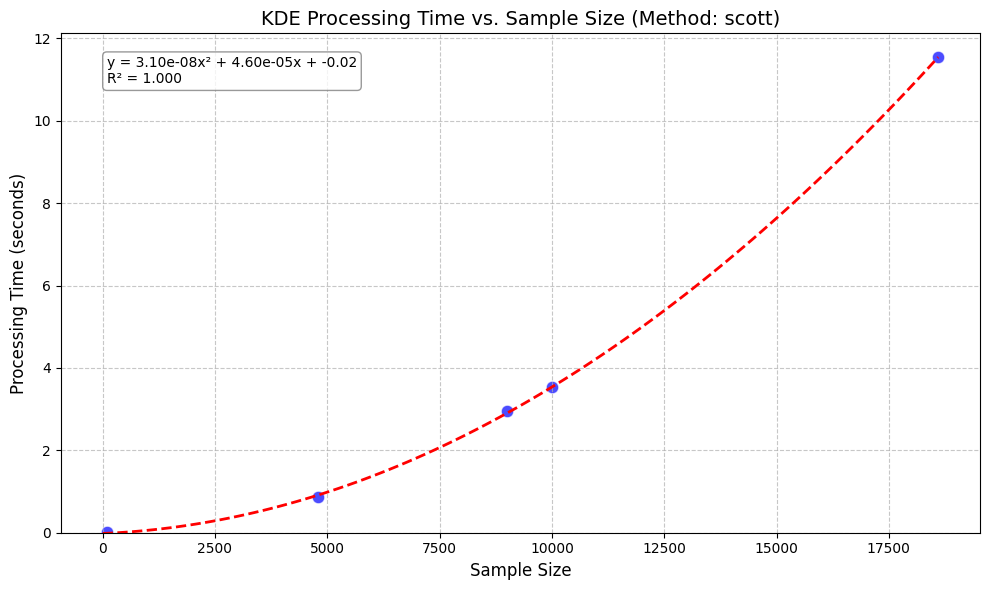

Saved extrapolation plot to: Dataset2\kde_extrapolation_d18704_t100000_scott.png


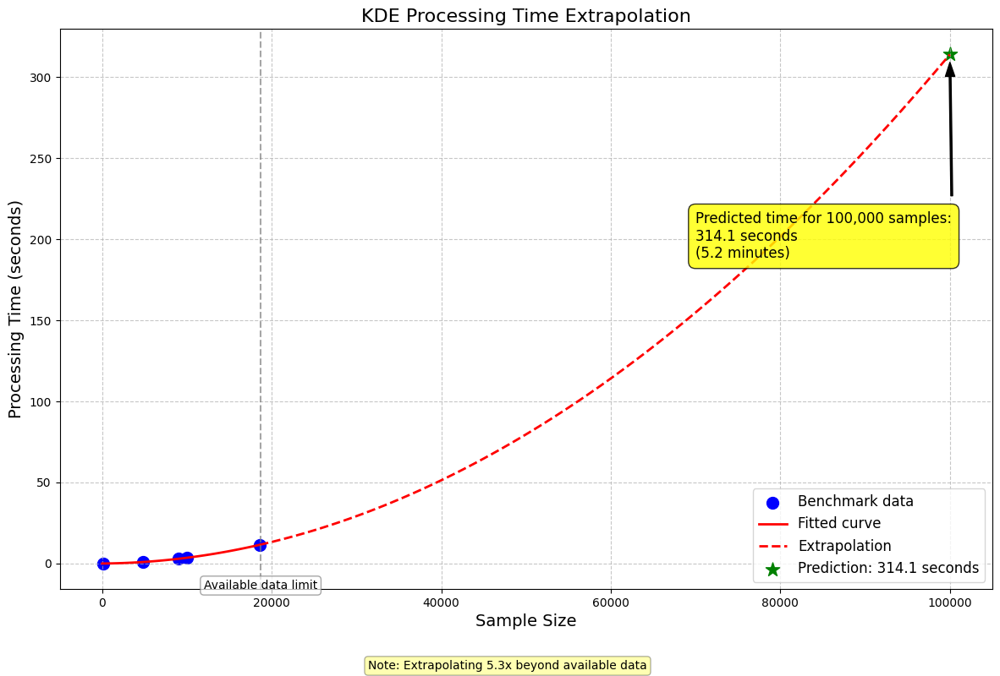

Saved simple plot to: Dataset2\kde_simple_d18704_t100000_scott.png


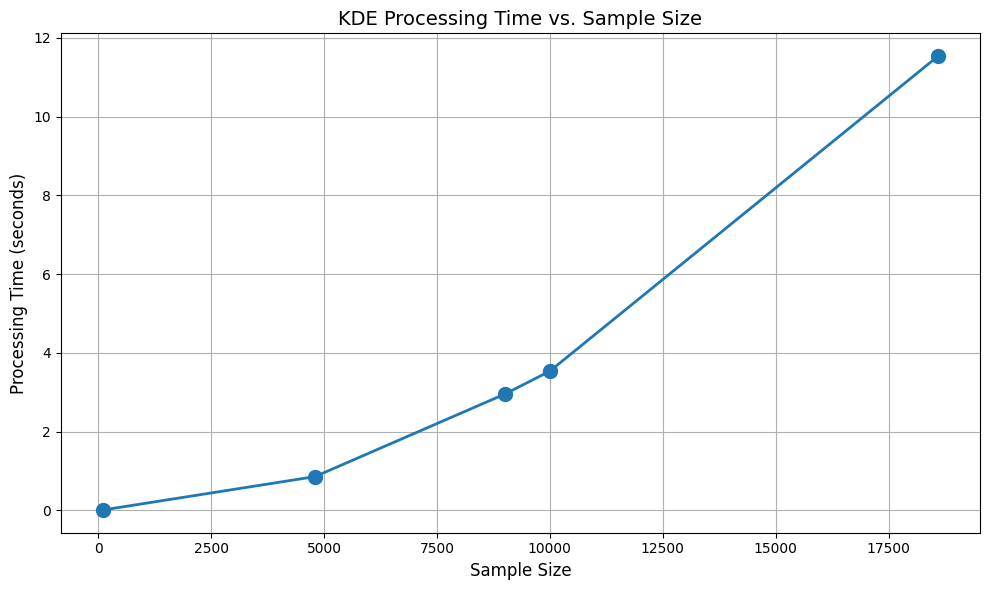

Saved bar chart to: Dataset2\kde_barchart_d18704_t100000_scott.png


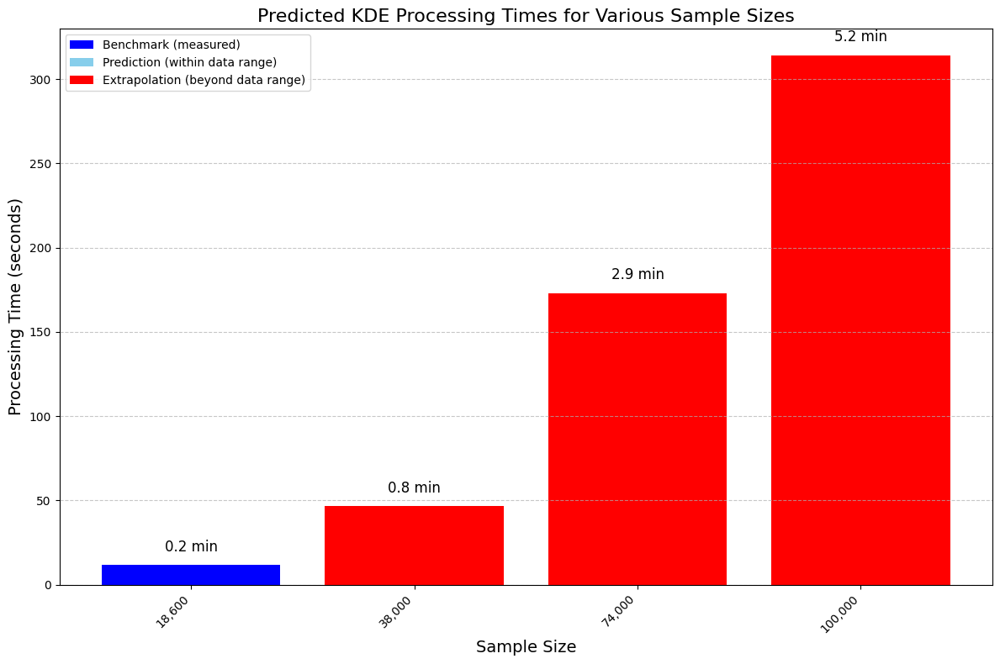

In [7]:
results, model, predictions = dc.KDE.benchmark_and_predict(
    data,
    method='scott', 
    target_size=100000,
    save_path=output_path 
)

### ClusterDC with Global Bandwidth Optimization for KDE

In [8]:
# Create a new folder
output_path = data.make_folder("Dataset2/01_Global_Bandwidth")

#Initialize and fit KDE with Global Bandwith Optimization
kde = dc.KDE(
    data=df_sample,
    kernel_types=['gaussian', 'epanechnikov', 'laplacian'],
    n_iter=50,
    save_path=str(output_path/'Dataset2_global_bandwidth_KDE')
)

# Fit KDE with optimized global bandwidth
kde.fit(method='global_bandwidth')

Bayesian Optimization: 100%|███████████████████████████████████████████████████████████| 50/50 [00:46<00:00,  1.09it/s]


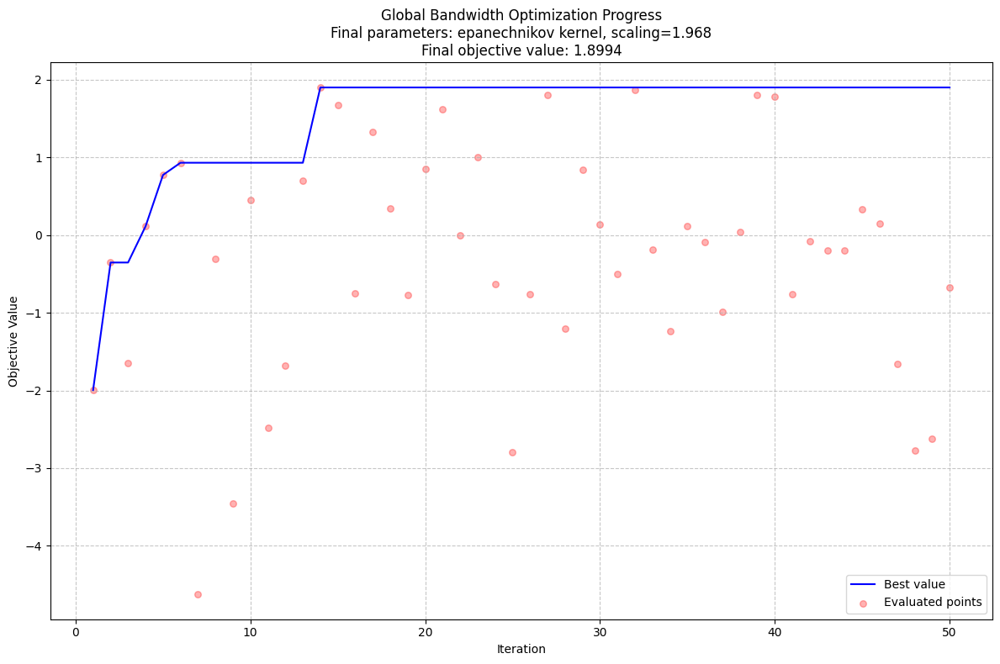

In [9]:
# plot the progress in Bayesian optimization
kde.plot_optimization_progress(save_path=str(output_path/'Dataset2_global_bandwidth_KDE'))  

Estimating grid density values: 100%|█████████████████████████████████████████| 2500/2500 [00:00<00:00, 9868.82point/s]


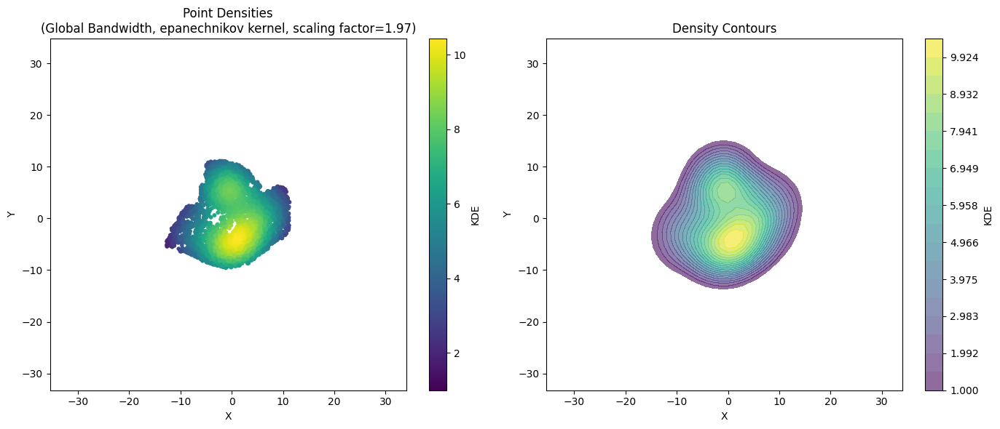

In [10]:
#plot KDE outcomes 
kde.plot_results(vmin=1)  

In [11]:
# get the optimal kernel
kde.get_optimization_report()

OptimizationResult(method_used='global_bandwidth', kernel_type='epanechnikov', k=None, scaling_factor=1.968138683032898)

In [12]:
# generate a report with all 100 Bayesian iterations with kernel parameters used and their objective values ranked 
# from best from worst fit
kde.get_iteration_results()

,iteration,kernel,scaling_factor,objective_value
0,14,epanechnikov,1.968139,-1.899403
1,32,epanechnikov,1.933985,-1.868646
2,27,epanechnikov,1.860652,-1.800613
3,39,epanechnikov,1.859972,-1.799969
4,40,epanechnikov,1.838423,-1.779429
5,15,epanechnikov,1.733887,-1.676000
6,21,epanechnikov,1.683070,-1.623285
7,17,gaussian,1.890183,-1.330061
8,23,gaussian,1.535187,-0.998827
9,6,gaussian,1.471798,-0.930534


In [13]:
# Initialize and run ClusterDC using gap_order= max_cluster that finds the maximum number of clusters in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order='max_clusters', 
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.57%/s]


Separability and gaps:
   separability       gap gap_order
0      1.000000        --        --
1      0.079808  0.920192         1
2      0.000000  0.079808         2

Number of clusters:  2



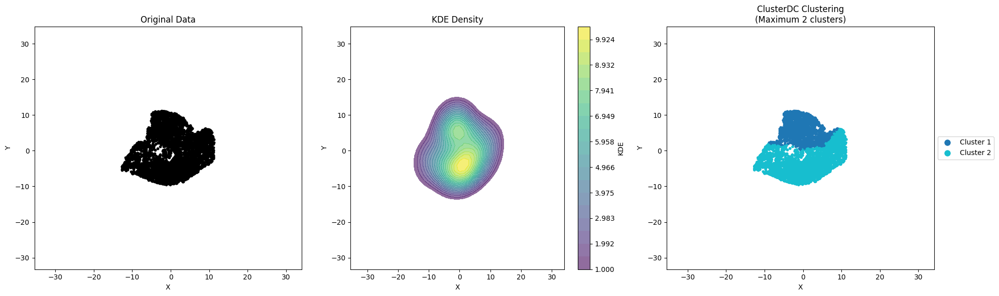

In [14]:
#plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=1)

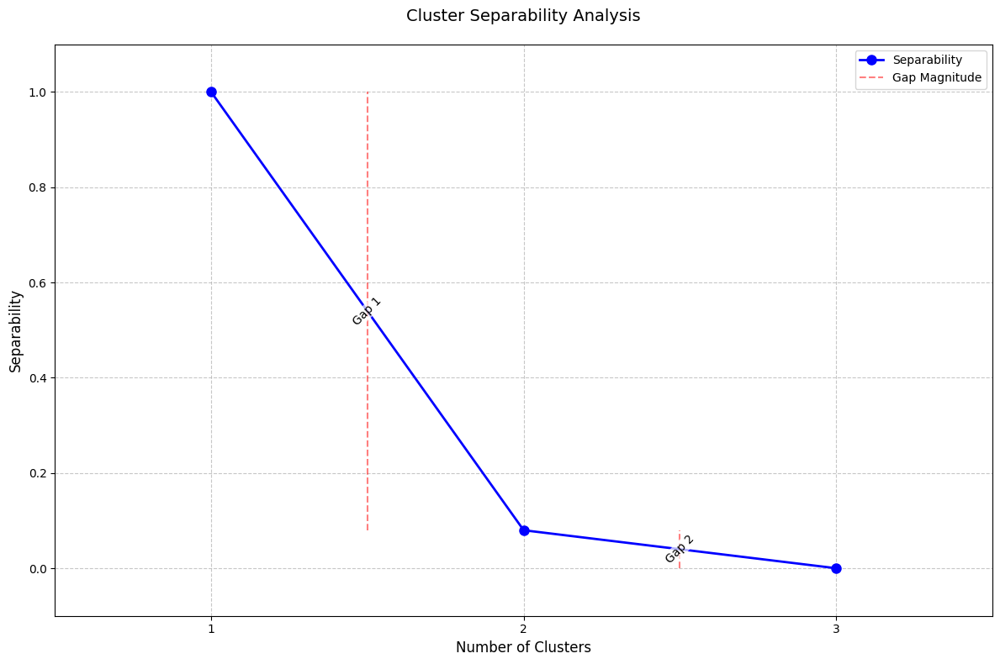

In [15]:
# plot separability plot
cluster_dc.plot_separability(save_path=str(output_path/'Dataset2_global_bandwidth_separability_analysis.png'))

In [16]:
cluster_dc.get_cluster_assignments()

,PaCMAP_X,PaCMAP_Y,kde_density,cluster
0,0.709443,-5.948870,9.914277,2
1,9.364301,-0.238479,5.083846,2
2,-2.183837,-8.038670,7.543575,2
3,-1.868341,1.786352,7.325351,1
4,-2.404999,9.341936,5.919758,1
...,...,...,...,...
4995,-3.315307,-7.763679,7.132416,2
4996,1.592524,6.652590,7.508197,1
4997,4.102388,-1.435929,9.235208,2
4998,-3.565149,4.955522,7.162749,1


Found 14353 points without exact matches. Using 1-nearest neighbors for these points.


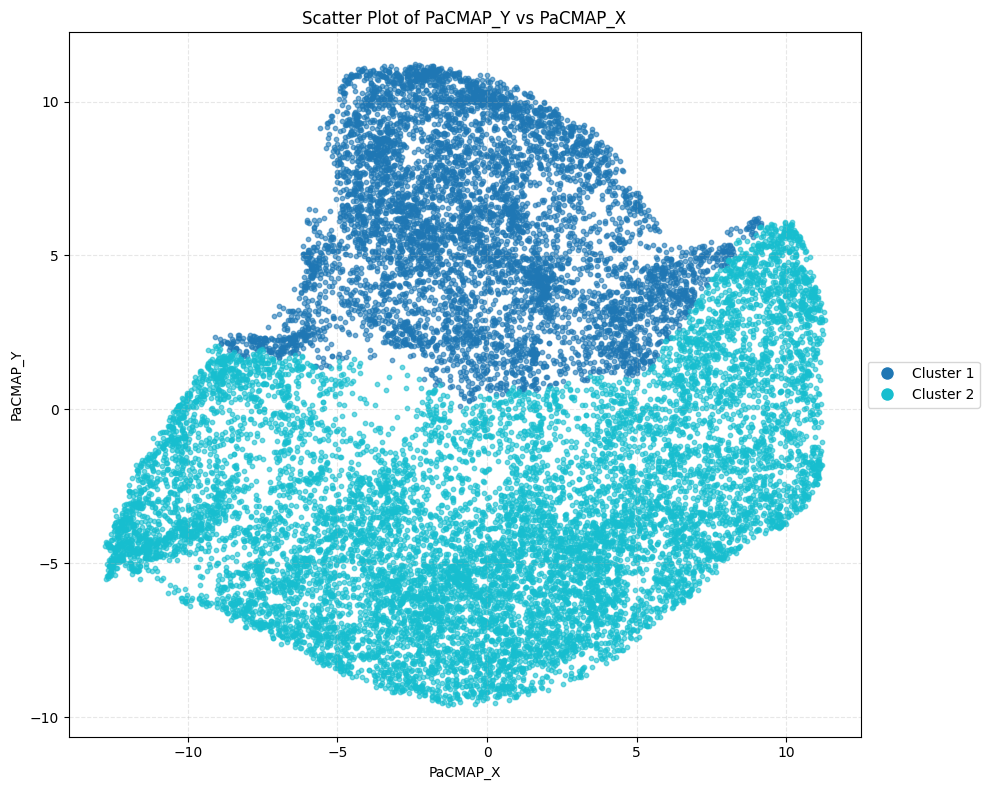

In [17]:
# Assign labels to original data using KDTree nearest neighbor
df['cluster'] = data.assign_nearest_cluster(
    sampled_data=df_sample,
    cluster_labels=assignments[0],
    columns=['PaCMAP_X', 'PaCMAP_Y']
)

# You can also visualize it using the updated DataFrame
data.plot_scatter(x='PaCMAP_X', y='PaCMAP_Y', labels='cluster')

### ClusterDC with Scott's Rule to Determine Bandwidth of KDE

In [18]:
# Create a new folder
output_path = data.make_folder("Dataset2/02_Scott_Bandwidth")

# Initialize and fit KDE with Scott's rule
kde = dc.KDE(
    data=df_sample,
)

# Fit KDE with global bandwidth's rule
kde.fit(method='scott')

Estimating grid density values: 100%|█████████████████████████████████████████| 2500/2500 [00:00<00:00, 6738.42point/s]


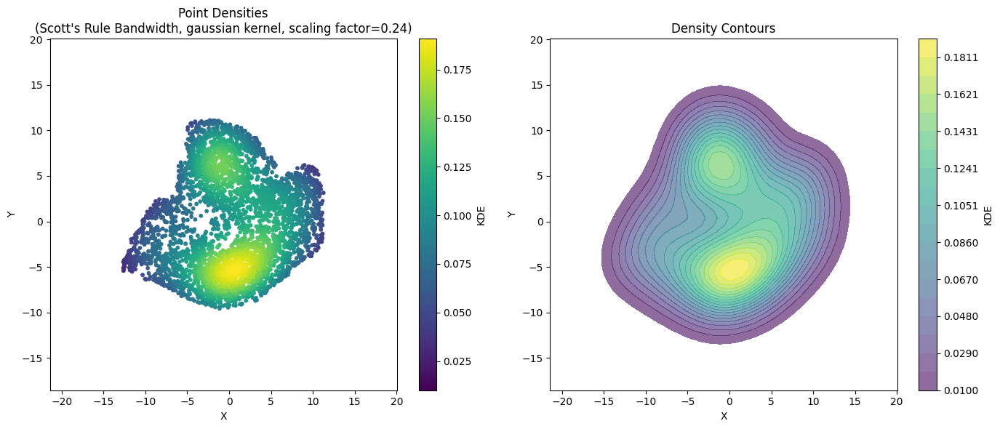

In [19]:
# plot KDE outcomes 
kde.plot_results(vmin=0.01)  

In [20]:
# Initialize and run ClusterDC using max_cluster method that finds the maximum number of clusters in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order='max_clusters',
    save_path=str(output_path / 'Dataset2_Scott_ClusterDC.png')
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.97%/s]


Separability and gaps:
   separability       gap gap_order
0      1.000000        --        --
1      0.240268  0.759732         1
2      0.000000  0.240268         2

Number of clusters:  2



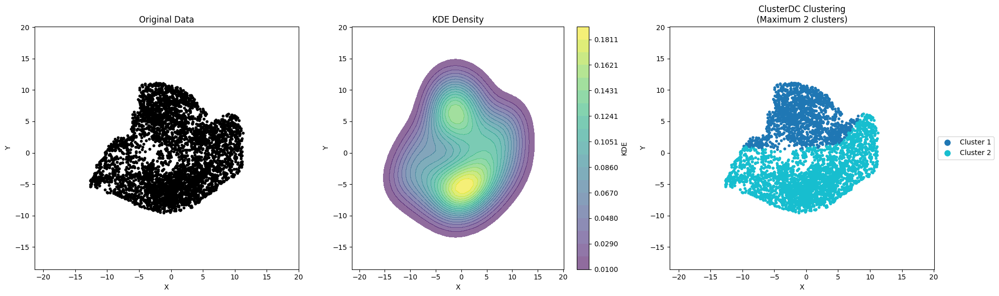

In [21]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.01)

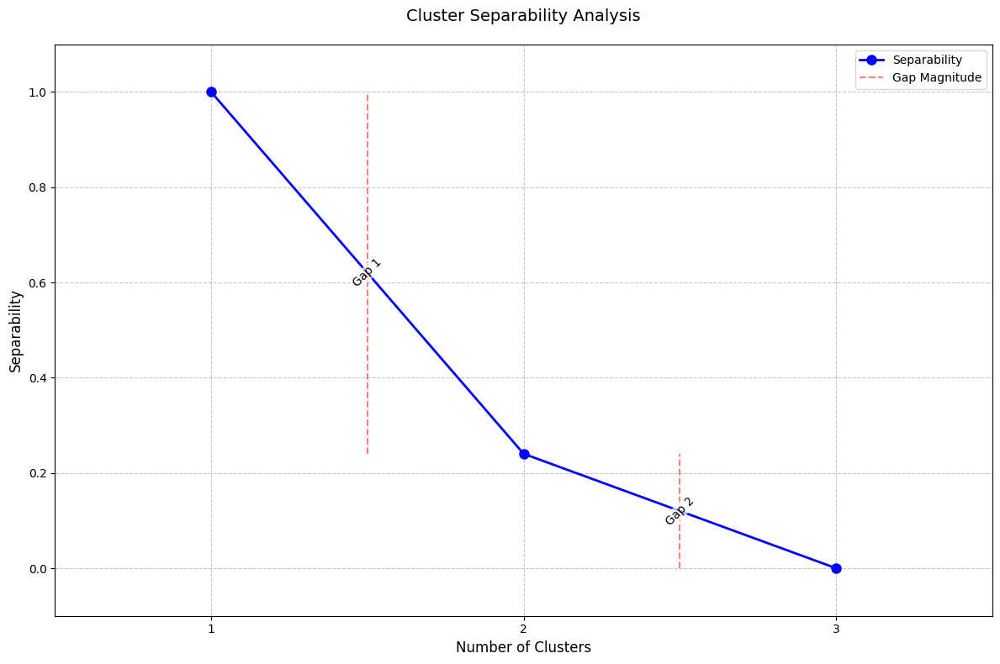

In [22]:
# plot separability plot
cluster_dc.plot_separability(save_path=str(output_path / 'Dataset2_Scott_separability_analysis.png'))

Found 14353 points without exact matches. Using 1-nearest neighbors for these points.


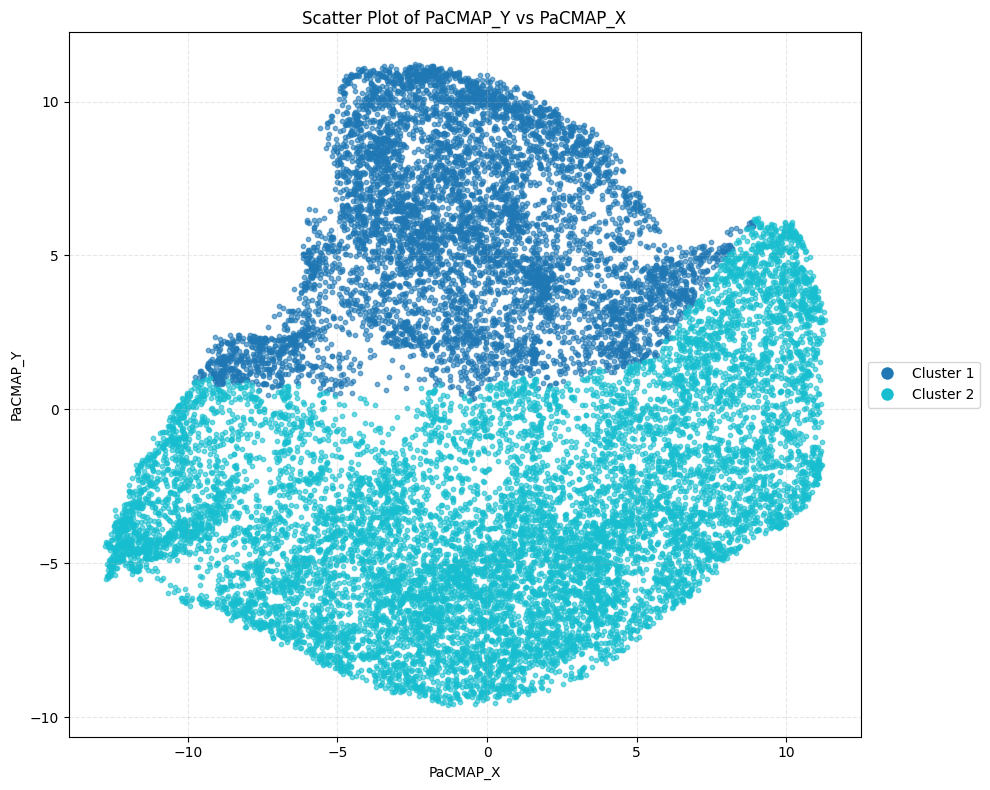

In [23]:
# Assign labels to original data
df['cluster'] = data.assign_nearest_cluster(
    sampled_data=df_sample,
    cluster_labels=assignments[0],
    columns=['PaCMAP_X', 'PaCMAP_Y']
)

# You can also visualize it using the updated DataFrame
data.plot_scatter(x='PaCMAP_X', y='PaCMAP_Y', labels='cluster')

Both Global Bandwidth Optimization and Scott's Bandwidth rule identified two main clusters in the data. These clusters represent the main clusters at a global scale. The next section will investigate the use of local bandwidth to identify local clusters. The user should decide the level of localization required to capture variability/separability between points.

### ClusterDC with Local Bandwidth Optimization for KDE

In [24]:
# Create a new folder
output_path = data.make_folder("Dataset2/03_Local_Bandwidth")

# Initialize and fit KDE with local optimized bandwidth
kde = dc.KDE(
    data=df_sample,
    kernel_types=['gaussian', 'epanechnikov', 'laplacian'],
    n_iter=50
)

# Fit KDE with optimized local bandwidth
kde.fit(method='local_bandwidth')

Bayesian Optimization: 100%|███████████████████████████████████████████████████████████| 50/50 [02:14<00:00,  2.69s/it]


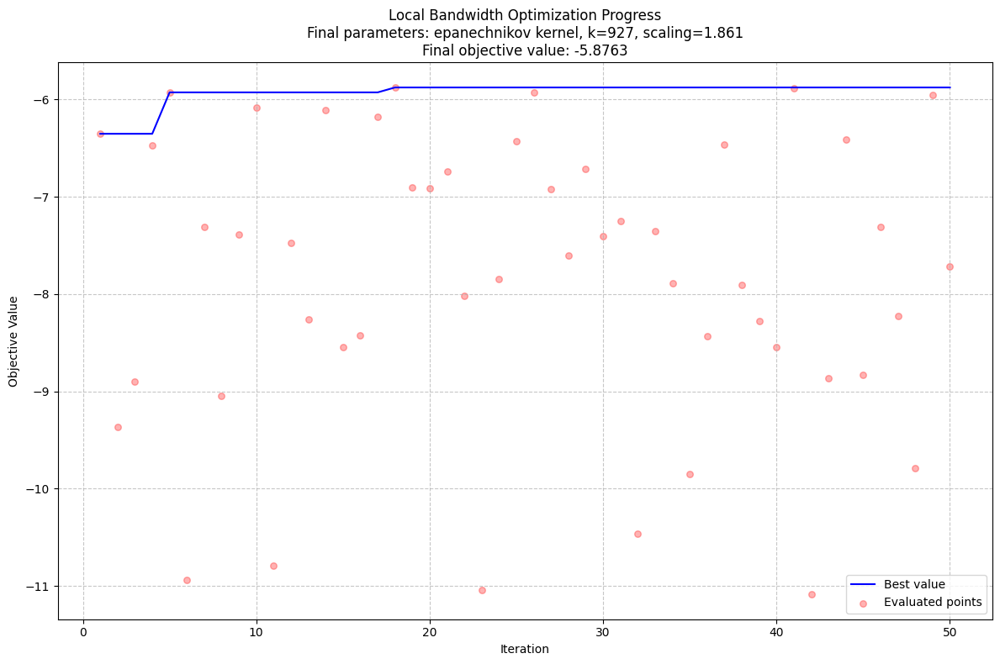

In [25]:
# plot the progress in Bayesian optimization
kde.plot_optimization_progress(save_path=str(output_path/ 'Dataset2_local_bandwidth_optimization_progress.png'))

Estimating grid density values: 100%|██████████████████████████████████████████| 2500/2500 [00:09<00:00, 258.63point/s]


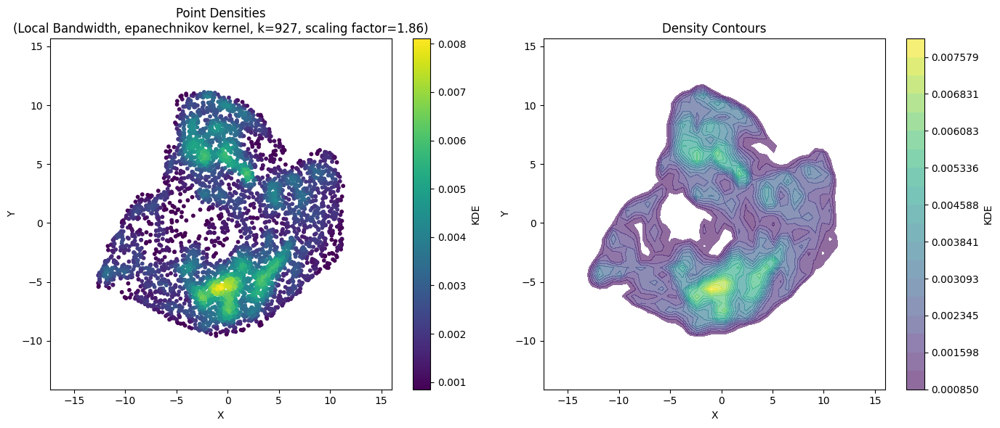

In [26]:
# plot KDE outcomes 
kde.plot_results(vmin=0.00085) 

In [27]:
# Initialize and run ClusterDC using max_cluster method that finds the maximum number of clusters in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order='max_clusters', 
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:47<00:00,  2.09%/s]


Separability and gaps:
    separability       gap gap_order
0       1.000000        --        --
1       0.704556  0.295444         1
2       0.531298  0.173258         2
3       0.495978   0.03532         6
4       0.461441  0.034537         7
5       0.366317  0.095124         3
6       0.331979  0.034338         8
7       0.322705  0.009275        20
8       0.315338  0.007367        22
9       0.296889  0.018449        12
10      0.284905  0.011984        15
11      0.277854  0.007051        23
12      0.257058  0.020796        11
13      0.251966  0.005093        24
14      0.240214  0.011752        16
15      0.235929  0.004285        25
16      0.235331  0.000598        31
17      0.218306  0.017025        13
18      0.216046   0.00226        27
19      0.214960  0.001087        30
20      0.176072  0.038888         5
21      0.165190  0.010882        17
22      0.155472  0.009718        19
23      0.147578  0.007893        21
24      0.130583  0.016995        14
25      0.1291

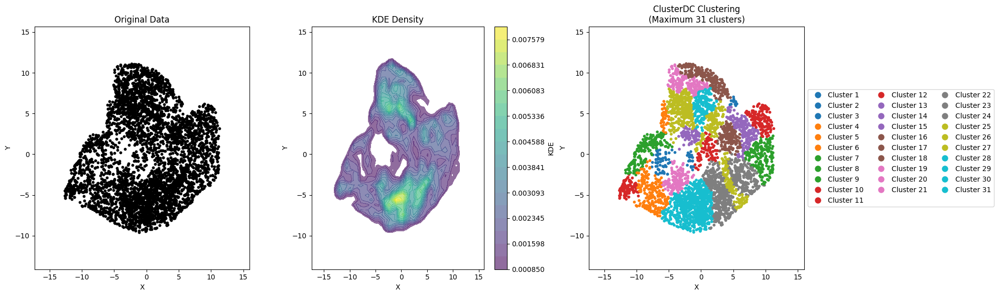

In [28]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info,vmin=0.00085)

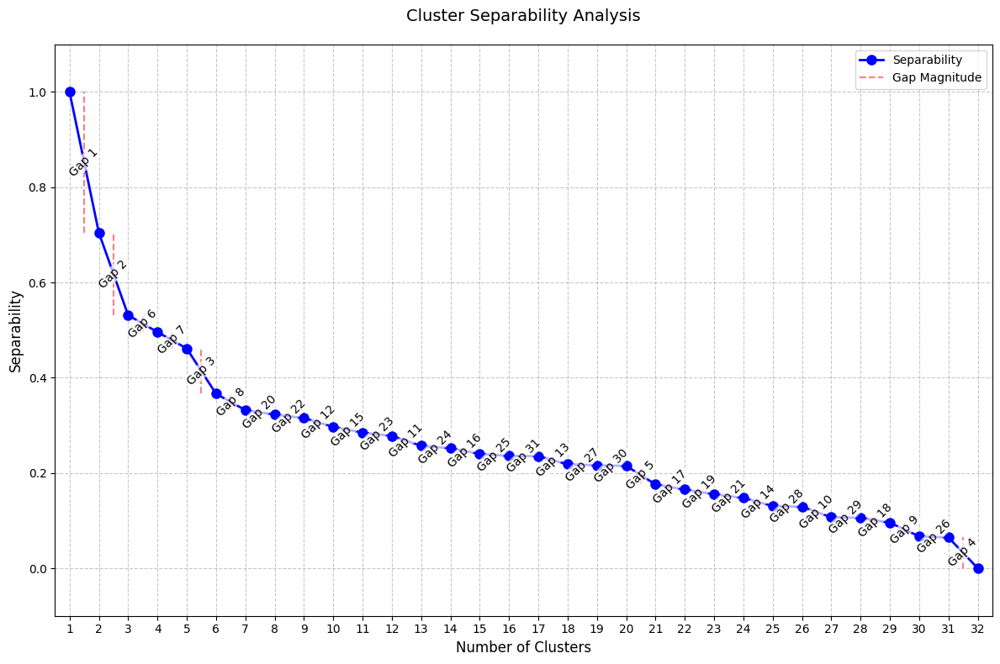

In [29]:
# plot separability plot
cluster_dc.plot_separability(save_path=str(output_path/ 'Dataset2_local_bandwidth_analysis.png'))

You can notice a similarity between this plot and the elbow plot often used in determining the best number of clusters in K-means algorithm. It appears that the idea of using the 1st gap might work when you have a small number of clusters, say 3 to 7 clusters. However, when you want to find the best gap that separates clusters, you need to plot this separability plot and use an elbow rule that helps you determine an acceptable number of clusters that you can explain and that have meaning. This needs to be documented from now on, and I would like you to review this and comment on it. In this example, Gap 7 or Gap 8 (5 to 7 clusters) seems reasonable for this dataset.<br>

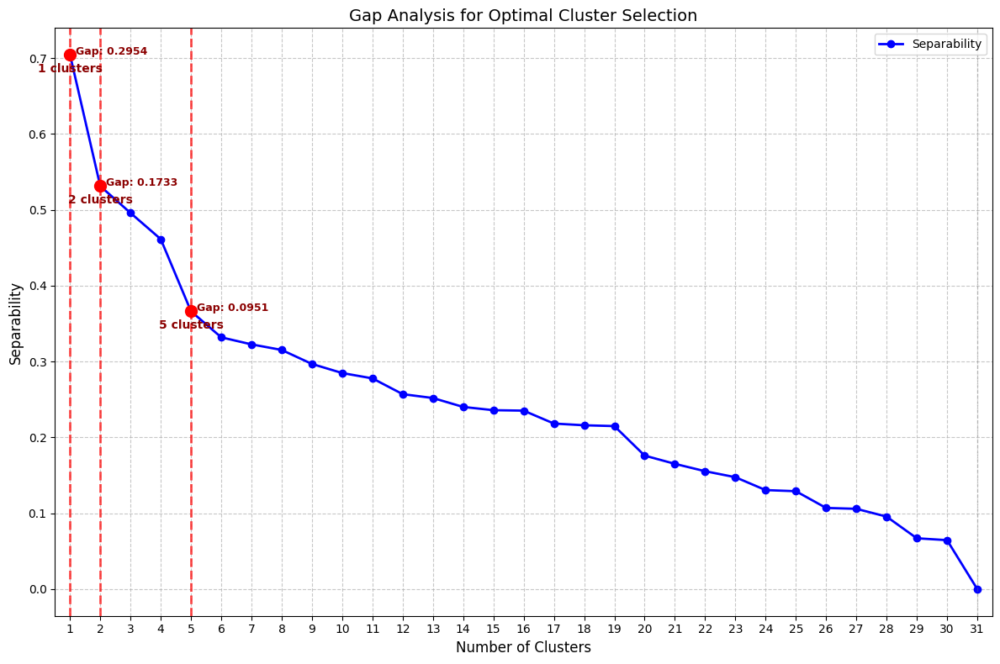

Optimal cluster counts identified: [1, 2, 5]


In [30]:
# Find optimal number of clusters using direct gap method (default method)
optimal_k = cluster_dc.find_optimal_clusters()

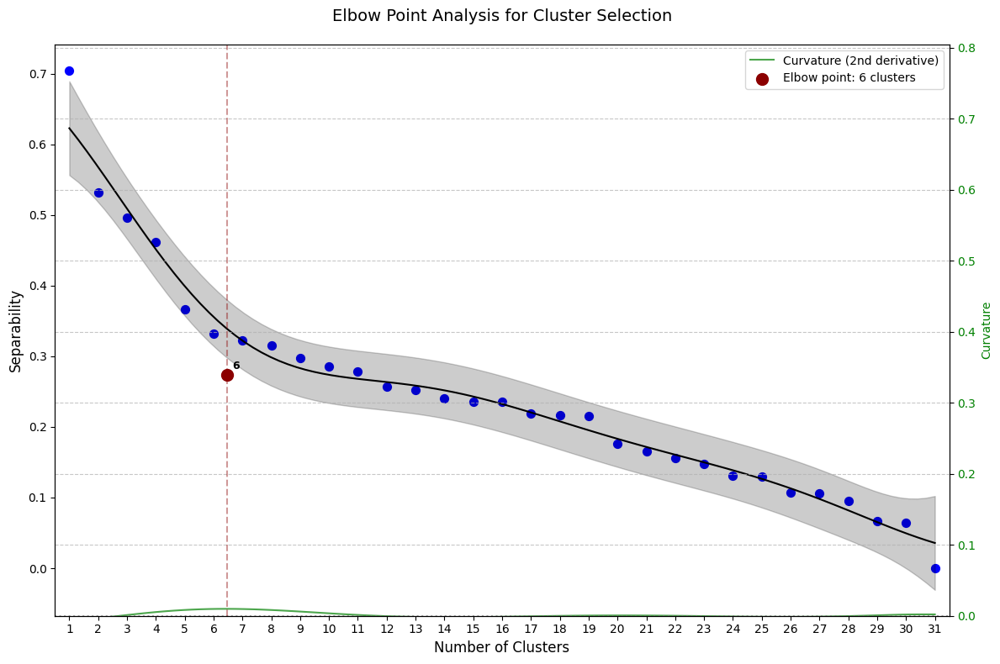

Main elbow points identified (clusters): [6]


In [31]:
# Find optimal number of clusters using elbow rule obtained from 2nd derivative of a gaussian process regression
optimal_k = cluster_dc.find_optimal_clusters(method='gpr')

In [32]:
# Initialize and run ClusterDC using n_clusters=6 after following the recommendations of  find_optimal_clusters()
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order=None,
    n_clusters=6
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:47<00:00,  2.10%/s]


Number of clusters:  6



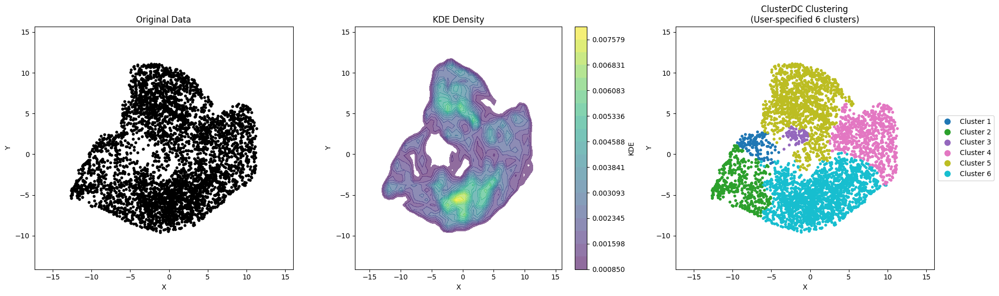

In [33]:
#plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info,vmin=0.00085)

In [34]:
# Initialize and run ClusterDC using n_clusters=2 
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order=None,
    n_clusters=5
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:46<00:00,  2.17%/s]


Number of clusters:  5



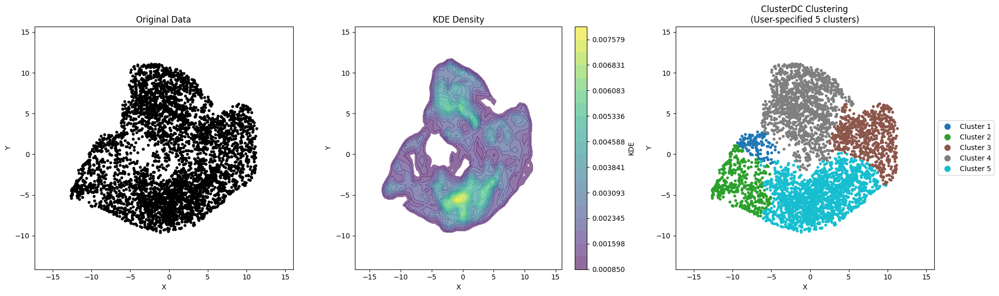

In [35]:
#plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.00085)

In [36]:
# Initialize and run ClusterDC using gap_order=2 method that finds the clusters with the largest gap in separability
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order=2,
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:49<00:00,  2.03%/s]


Separability and gaps:
    separability       gap gap_order
0       1.000000        --        --
1       0.704556  0.295444         1
2       0.531298  0.173258         2
3       0.495978   0.03532         6
4       0.461441  0.034537         7
5       0.366317  0.095124         3
6       0.331979  0.034338         8
7       0.322705  0.009275        20
8       0.315338  0.007367        22
9       0.296889  0.018449        12
10      0.284905  0.011984        15
11      0.277854  0.007051        23
12      0.257058  0.020796        11
13      0.251966  0.005093        24
14      0.240214  0.011752        16
15      0.235929  0.004285        25
16      0.235331  0.000598        31
17      0.218306  0.017025        13
18      0.216046   0.00226        27
19      0.214960  0.001087        30
20      0.176072  0.038888         5
21      0.165190  0.010882        17
22      0.155472  0.009718        19
23      0.147578  0.007893        21
24      0.130583  0.016995        14
25      0.1291

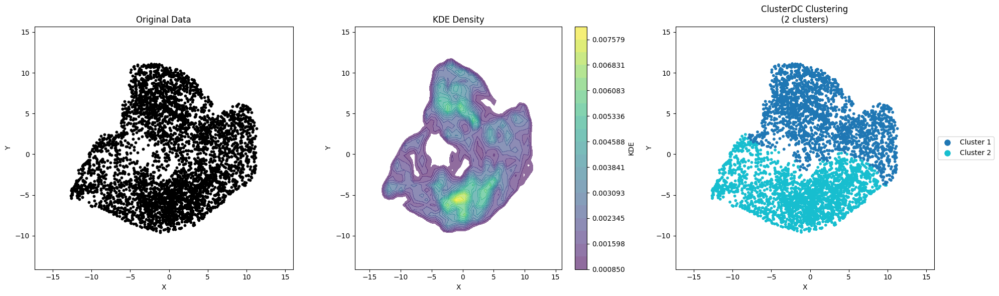

In [37]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.00085)

In [38]:
# Initialize and run ClusterDC using gap_order=3 method that finds the clusters with the largest gap in separability
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order=3,
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [00:45<00:00,  2.20%/s]


Separability and gaps:
    separability       gap gap_order
0       1.000000        --        --
1       0.704556  0.295444         1
2       0.531298  0.173258         2
3       0.495978   0.03532         6
4       0.461441  0.034537         7
5       0.366317  0.095124         3
6       0.331979  0.034338         8
7       0.322705  0.009275        20
8       0.315338  0.007367        22
9       0.296889  0.018449        12
10      0.284905  0.011984        15
11      0.277854  0.007051        23
12      0.257058  0.020796        11
13      0.251966  0.005093        24
14      0.240214  0.011752        16
15      0.235929  0.004285        25
16      0.235331  0.000598        31
17      0.218306  0.017025        13
18      0.216046   0.00226        27
19      0.214960  0.001087        30
20      0.176072  0.038888         5
21      0.165190  0.010882        17
22      0.155472  0.009718        19
23      0.147578  0.007893        21
24      0.130583  0.016995        14
25      0.1291

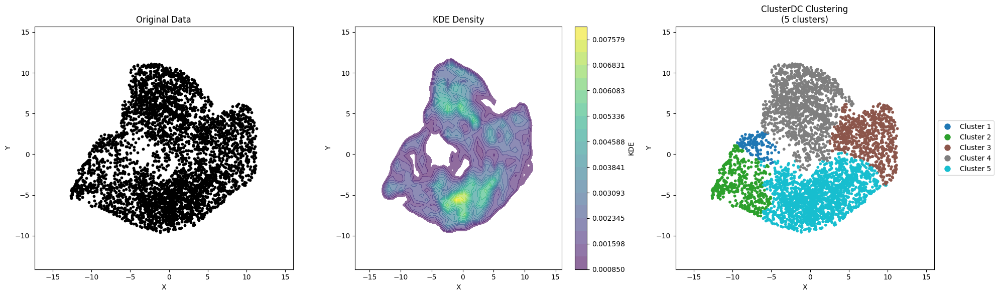

In [39]:
# plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.00085)

Found 14353 points without exact matches. Using 1-nearest neighbors for these points.


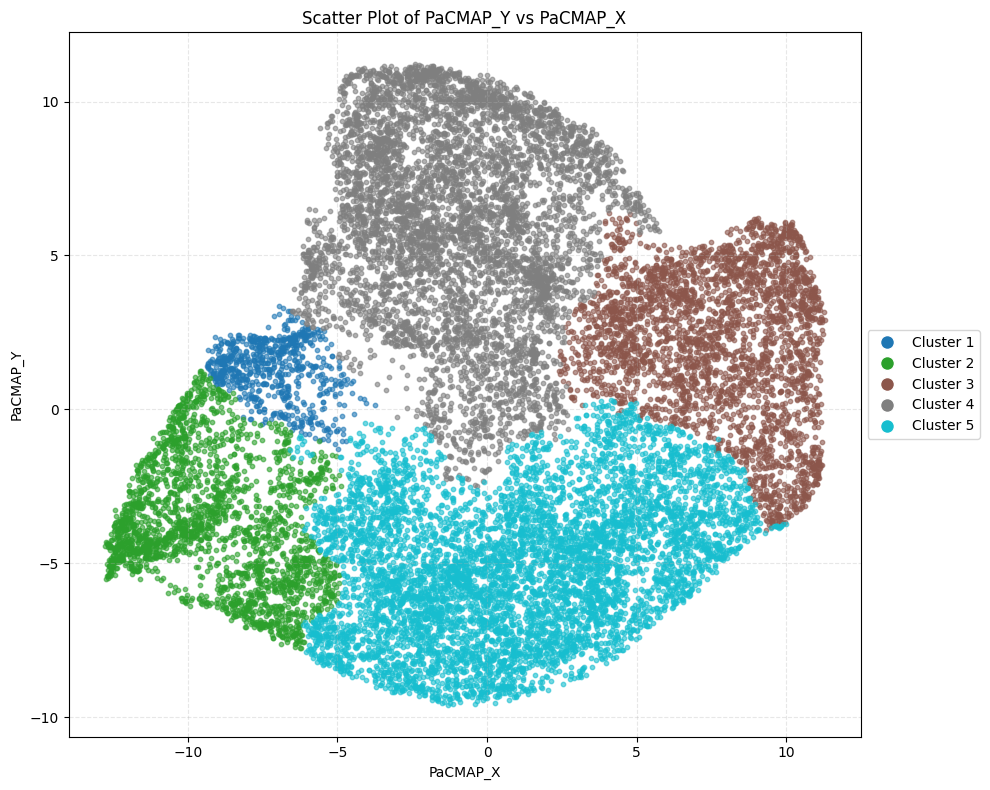

In [40]:
# Assign labels to original data using KDTree nearest 1 neighbor
df['cluster'] = data.assign_nearest_cluster(
    sampled_data=df_sample,
    cluster_labels=assignments[0],
    columns=['PaCMAP_X', 'PaCMAP_Y']
)

# You can also visualize it using the updated DataFrame
data.plot_scatter(x='PaCMAP_X', y='PaCMAP_Y', labels='cluster')

Found 14353 points without exact matches. Using 3-nearest neighbors for these points.


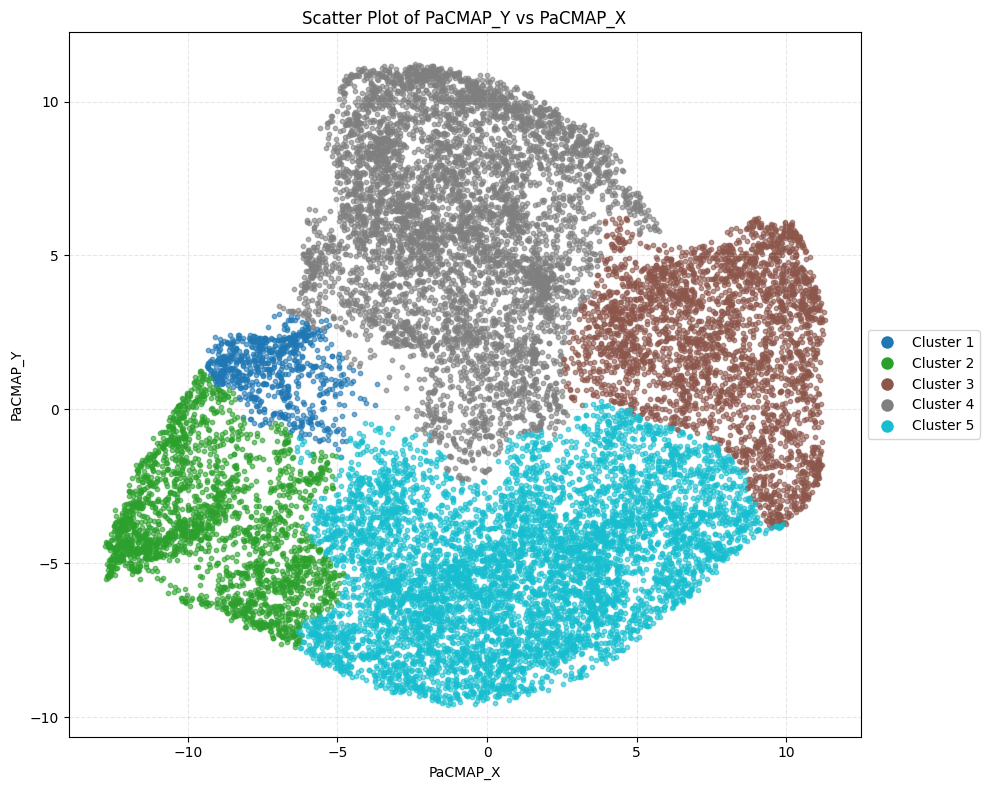

In [41]:
# Assign labels to original data using KDTree nearest 3 neighbors
df['cluster'] = data.assign_nearest_cluster(
    sampled_data=df_sample,
    cluster_labels=assignments[0],
    columns=['PaCMAP_X', 'PaCMAP_Y'],
    k_neighbors=3
)

# Visualize the clustering results
data.plot_scatter(x='PaCMAP_X', y='PaCMAP_Y', labels='cluster')

Found 14353 points without exact matches. Using 20-nearest neighbors for these points.


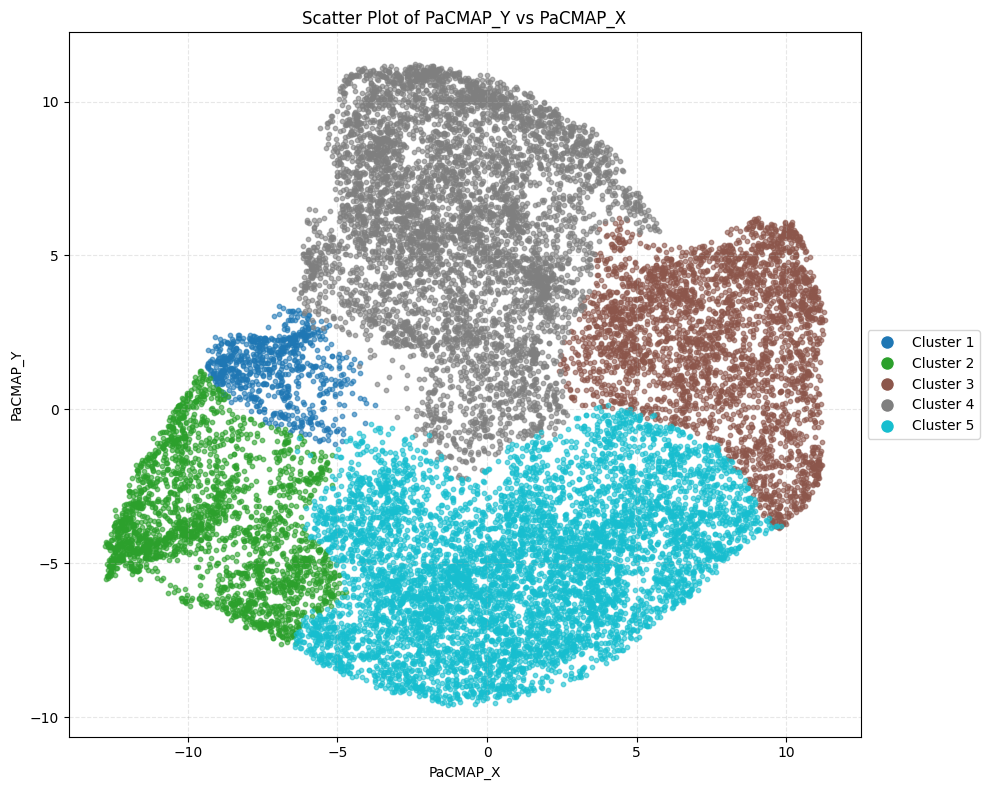

In [42]:
# Assign labels to original data using KDTree nearest 20 neighbors
df['cluster'] = data.assign_nearest_cluster(
    sampled_data=df_sample,
    cluster_labels=assignments[0],
    columns=['PaCMAP_X', 'PaCMAP_Y'],
    k_neighbors=20
)

# Visualize the clustering results
data.plot_scatter(x='PaCMAP_X', y='PaCMAP_Y', labels='cluster')

The more nearest neighbors you use to assign labels for unlabeled locations, the smoother and more contiguous the domains become at the boundary among them.

## Dataset 3: Spiral Data

In [43]:
# Create a Data object
data = dc.Data()
# Create a new folder
output_path = data.make_folder("Dataset3")
# read csv file with data
df = data.read_file('spiral_data.csv')
df

Successfully loaded data from spiral_data.csv
Shape: (312, 3)


,X,Y,C
0,31.95,7.95,3
1,31.15,7.30,3
2,30.45,6.65,3
3,29.70,6.00,3
4,28.90,5.55,3
...,...,...,...
307,15.75,13.85,2
308,15.65,14.05,2
309,15.65,14.25,2
310,15.65,14.50,2


In [44]:
data.get_summary()

,dtype,count,missing,missing_%,unique,mean,std,min,25%,50%,75%,max
X,float64,312,0,0.0,238,18.408,7.300,3.0,12.912,18.325,23.400,31.95
Y,float64,312,0,0.0,241,16.345,6.867,2.9,11.338,16.050,21.362,31.65
C,int64,312,0,0.0,3,2.016,0.816,1.0,1.000,2.000,3.000,3.00


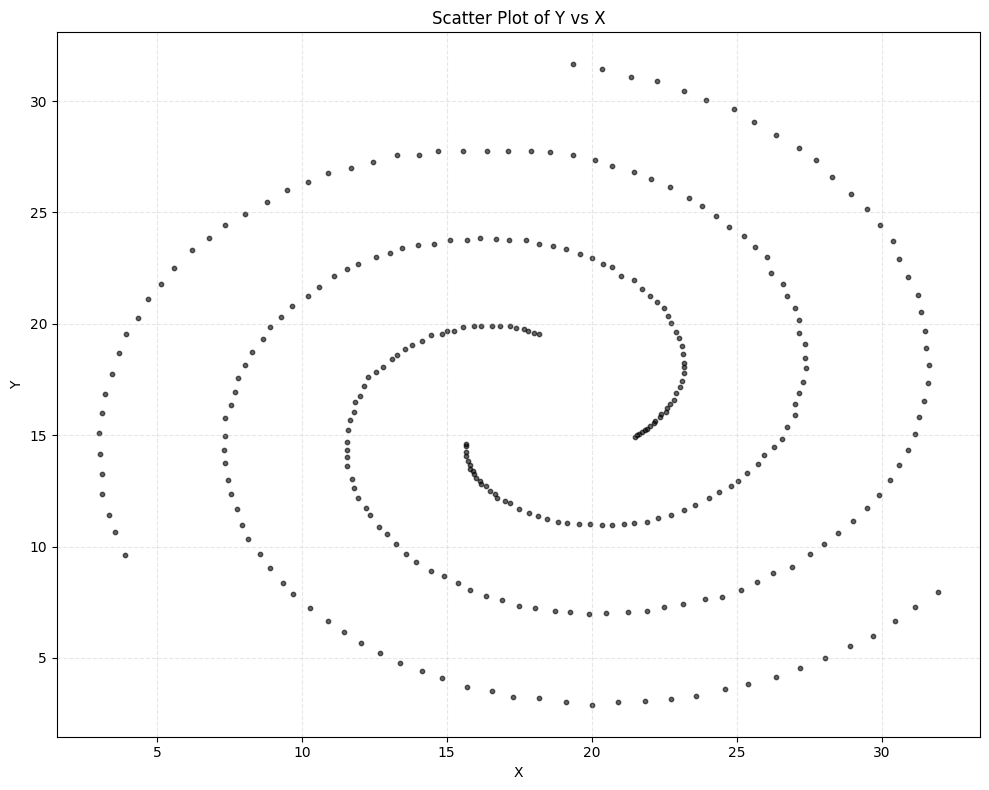

In [45]:
data.plot_scatter(x='X', y='Y', save_path=str(output_path /'dataset3.png'), show_kde=False)

### ClusterDC with Global Bandwidth Optimization for KDE

In [46]:
# Create a new folder
output_path = data.make_folder("Dataset3/01_Global_Bandwidth")

#Initialize and fit KDE with Global Bandwith Optimization
kde = dc.KDE(
    data=df,
    kernel_types=['gaussian', 'epanechnikov', 'laplacian'],
    n_iter=50,
    save_path=str(output_path/'Dataset3_global_bandwidth_KDE')
)

# Fit KDE with optimized global bandwidth
kde.fit(method='global_bandwidth')

Bayesian Optimization: 100%|███████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 31.98it/s]


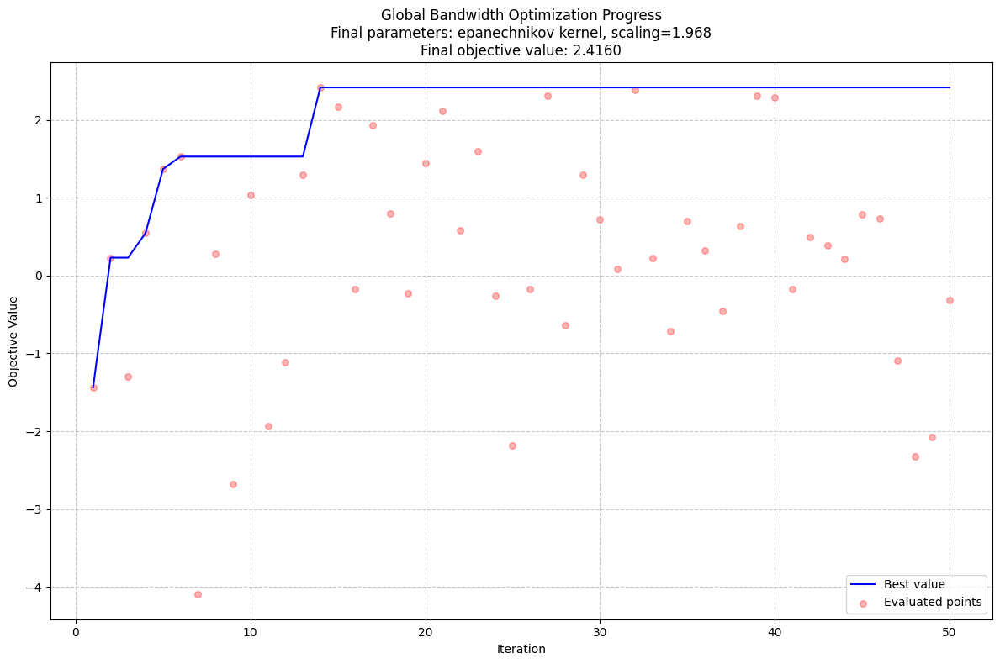

In [47]:
# plot the progress in Bayesian optimization
kde.plot_optimization_progress(save_path=str(output_path/'Dataset3_global_bandwidth_KDE'))  

Estimating grid density values: 100%|████████████████████████████████████████| 2500/2500 [00:00<00:00, 30629.13point/s]


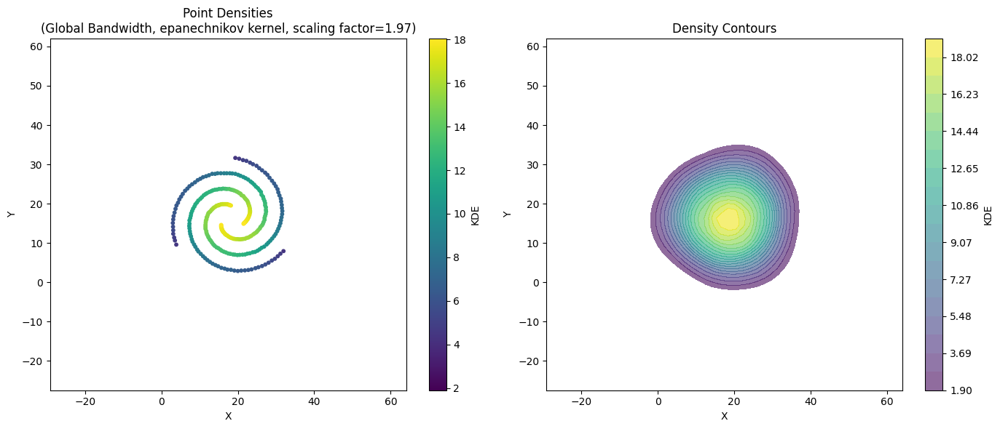

In [48]:
#plot KDE outcomes 
kde.plot_results(vmin=1.9)  

In [49]:
# get the optimal kernel
kde.get_optimization_report()

OptimizationResult(method_used='global_bandwidth', kernel_type='epanechnikov', k=None, scaling_factor=1.968138683032898)

In [50]:
# Initialize and run ClusterDC using gap_order= max_cluster that finds the maximum number of clusters in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order='max_clusters', 
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|█████████████████████████████████████████████████| 100/100 [00:00<00:00, 128.38%/s]


Separability and gaps:
   separability  gap gap_order
0           1.0   --        --
1           0.0  1.0         1

Number of clusters:  1



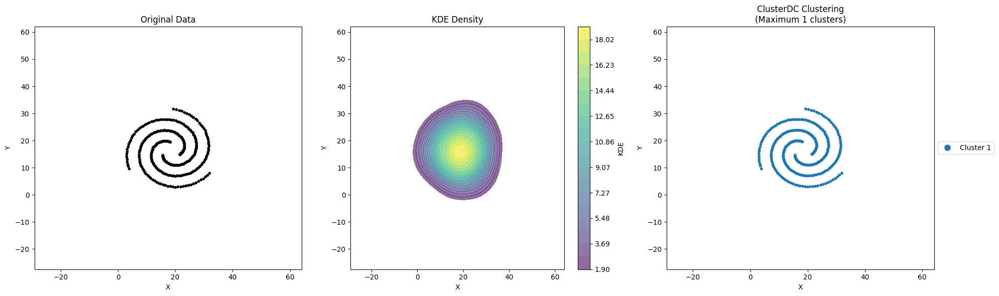

In [51]:
#plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=1.9)

Global bandwidth optimization method and Scott's rule will not be able to differentiate the three spiral clusters. Local bandwidth will be able to do that.

### ClusterDC with Local Bandwidth

In [52]:
# Create a new folder
output_path = data.make_folder("Dataset3/02_Local_Bandwidth")

# Initialize and fit KDE with local optimized bandwidth
kde = dc.KDE(
    data=df,
    columns=['X', 'Y'],
    kernel_types=['gaussian', 'epanechnikov', 'laplacian'],
    n_iter=50
)

# Fit KDE with optimized local bandwidth
kde.fit(method='local_bandwidth')

Bayesian Optimization: 100%|███████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 12.44it/s]


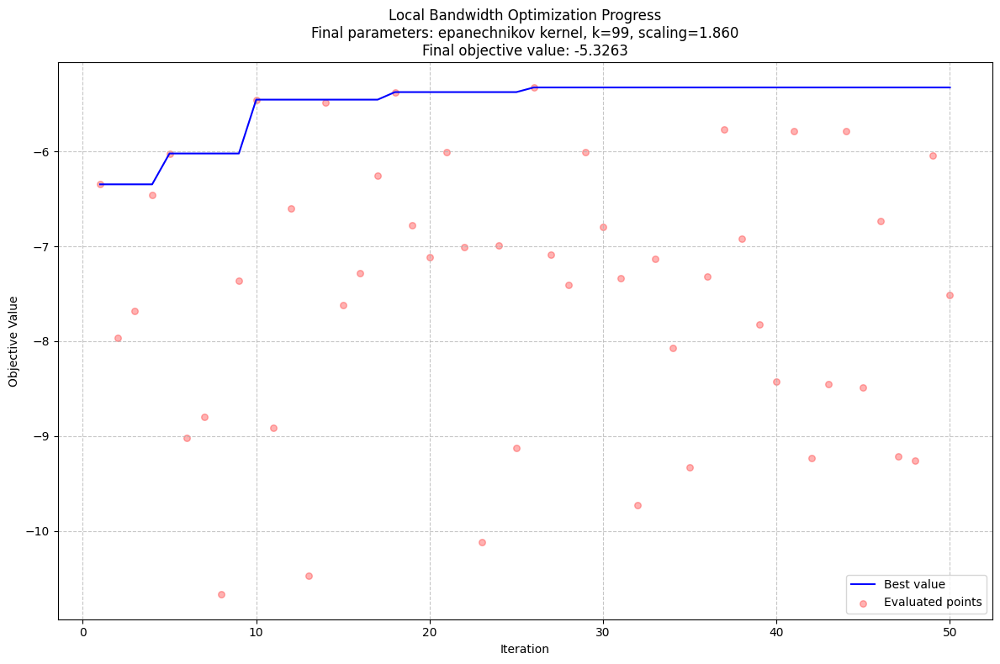

In [53]:
# plot the progress in Bayesian optimization
kde.plot_optimization_progress(save_path=str(output_path /'Dataset3_local_bandwidth_optimization_progress.png'))

Estimating grid density values: 100%|█████████████████████████████████████████| 2500/2500 [00:00<00:00, 4154.28point/s]


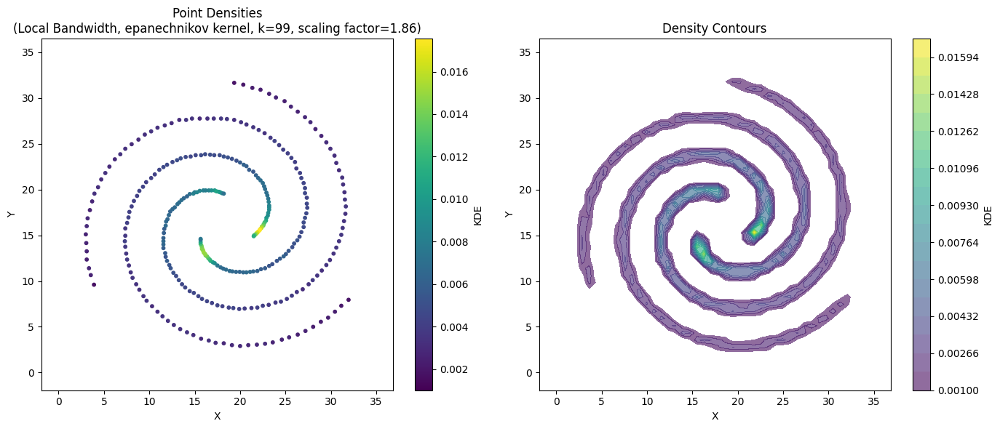

In [54]:
# plot KDE outcomes 
kde.plot_results(vmin=0.001) 

In [55]:
# Initialize and run ClusterDC using max_cluster method that finds the maximum number of clusters in the data
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    gap_order='max_clusters', 
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [01:30<00:00,  1.10%/s]


Separability and gaps:
    separability       gap gap_order
0       1.000000        --        --
1       1.000000      -0.0        70
2       1.000000      -0.0        69
3       0.542757  0.457243         1
4       0.539237  0.003519        36
5       0.534603  0.004634        31
6       0.529675  0.004928        30
7       0.523804  0.005871        20
8       0.520878  0.002926        42
9       0.518626  0.002251        50
10      0.511641  0.006985        16
11      0.500640  0.011001        12
12      0.477981  0.022659         5
13      0.462371   0.01561         7
14      0.459007  0.003364        38
15      0.457834  0.001173        57
16      0.452572  0.005261        27
17      0.447093  0.005479        24
18      0.445788  0.001305        55
19      0.431985  0.013803         8
20      0.430844  0.001142        58
21      0.425522  0.005322        26
22      0.423280  0.002242        51
23      0.410142  0.013138        11
24      0.404294  0.005848        21
25      0.4038

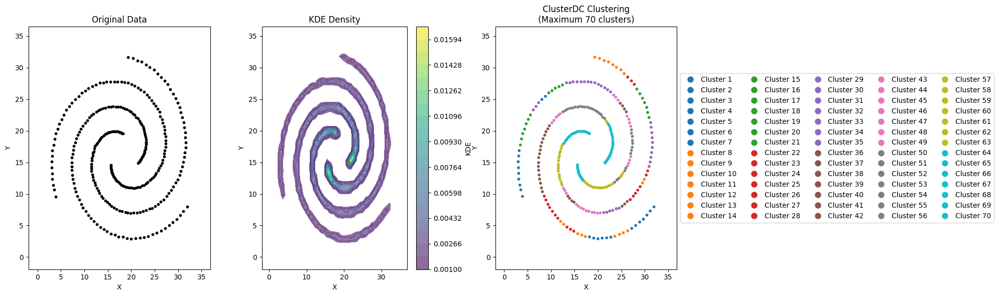

In [56]:
#plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin=0.001)

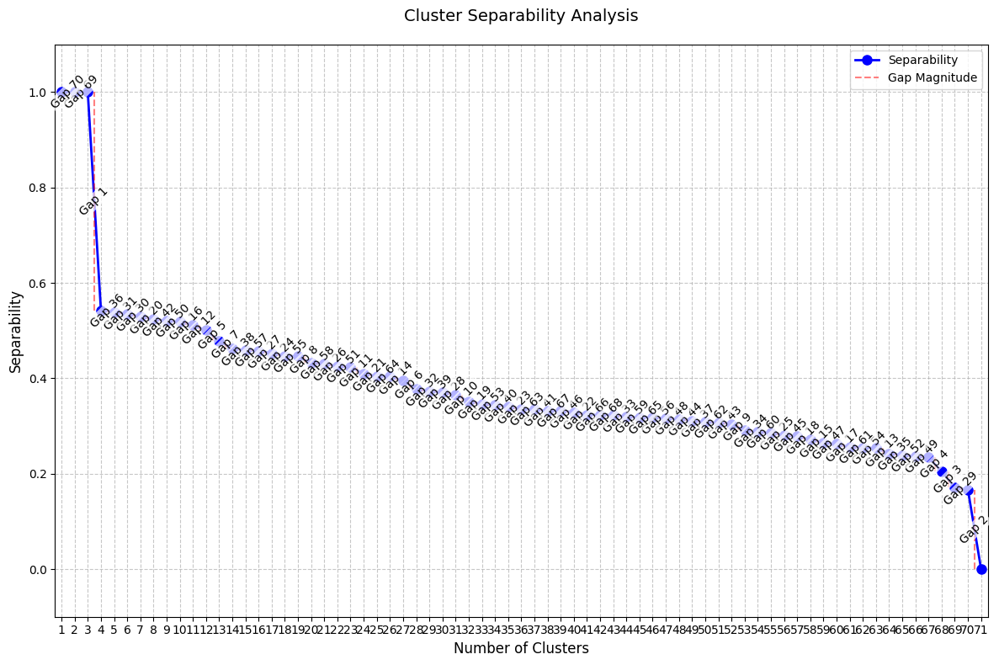

In [57]:
# plot separability plot
cluster_dc.plot_separability(save_path=str(output_path /'Dataset3_local_bandwidth_analysis.png'))

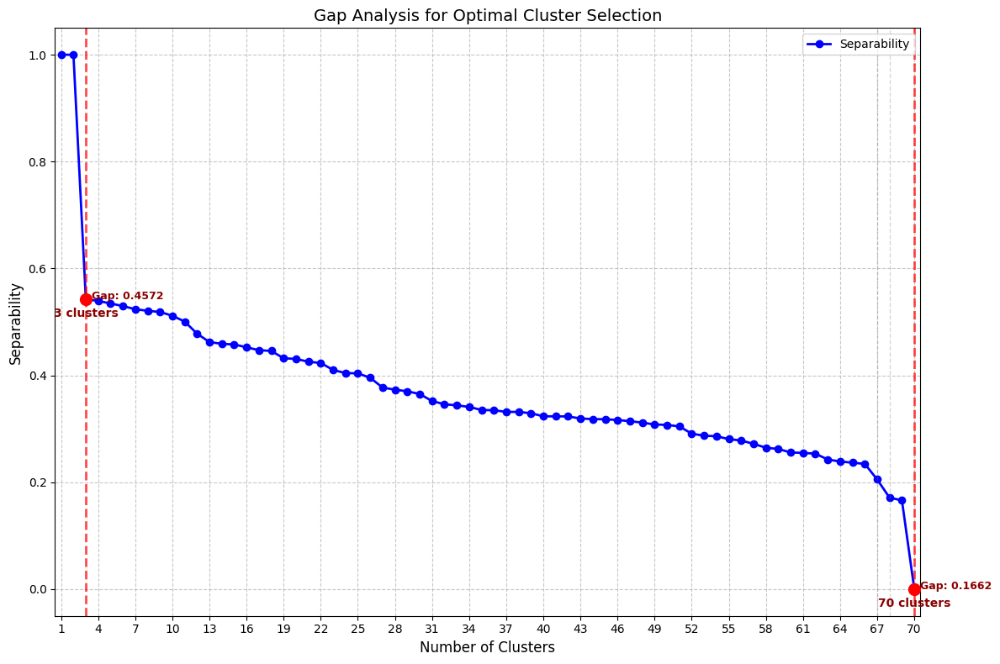

Optimal cluster counts identified: [3, 70]


In [58]:
# Find optimal number of clusters with the new method name
optimal_k = cluster_dc.find_optimal_clusters()

In [59]:
# Initialize and run ClusterDC using n_clusters=3 after following the recommendations of find_optimal_clusters()
# We also know that we have three clusters representing the three spirals
cluster_dc = dc.ClusterDC(
    kde_obj=kde,
    columns=['X', 'Y'],
    gap_order=None,
    n_clusters=3
)

# Run clustering
assignments, density_info = cluster_dc.run_clustering()

ClusterDC Clustering Progress: 100%|██████████████████████████████████████████████████| 100/100 [01:27<00:00,  1.14%/s]


Number of clusters:  3



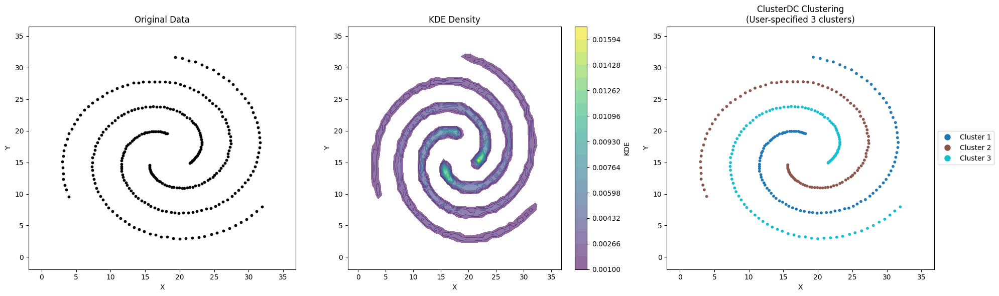

In [60]:
#plot clusterdc outputs
cluster_dc.plot_results(assignments, density_info, vmin = 0.001)

In [61]:
cluster_dc.get_cluster_assignments()

,X,Y,C,kde_density,cluster
0,31.95,7.95,3,0.001777,3
1,31.15,7.30,3,0.002094,3
2,30.45,6.65,3,0.002364,3
3,29.70,6.00,3,0.002405,3
4,28.90,5.55,3,0.002361,3
...,...,...,...,...,...
307,15.75,13.85,2,0.014015,2
308,15.65,14.05,2,0.012637,2
309,15.65,14.25,2,0.010947,2
310,15.65,14.50,2,0.008486,2


Local bandwidth KDE method can identify these three clusters with the help of ClusterDC